In [2]:
import tensorflow as tf
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

In [3]:
import keras
import pandas as pd
import tensorflow as tf

import numpy as np
# from keras.models import Sequential, Model
# from keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D
from keras.utils import np_utils

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D, Input,AveragePooling2D, BatchNormalization, LeakyReLU, SpatialDropout2D

# from keras.applications import MobileNet
# from keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2, InceptionV3
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import os
from sklearn.model_selection import train_test_split

import seaborn as sns
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.model_selection import KFold

from collections import defaultdict,Counter
from imblearn.over_sampling import SMOTE
from PIL import Image

from kerastuner import HyperModel

Using TensorFlow backend.


<h2>Data Loading and Preparation</h2>

In [4]:
def getSpeciesCode(x):
    part = x.split('_')
    if part[0] == 'ASETRI':
        return 0
    elif part[0] == 'EPTBOT':
        return 1
    elif part[0] == 'MYOEMA':
        return 2
    elif part[0] == 'PIPKUH':
        return 3
    elif part[0] == 'RHIMUS':
        return 4
    elif part[0] == 'RHYNAS':
        return 5
    elif part[0] == 'ROUAEG':
        return 6
    elif part[0] == 'TAPPER':
        return 7
    else:
        return 'Unknown'
    
def getSpecies(x):
    if x == 0:
        return 'A.tridens'
    elif x == 1:
        return 'E.bottae'
    elif x == 2:
        return 'M.emarginatus'
    elif x == 3:
        return 'P.kuhli'
    elif x == 4:
        return 'R.muscatellum'
    elif x == 5:
        return 'R.nasutus'
    elif x == 6:
        return 'R.aegyptius'
    elif x == 7:
        return 'T.perforatus'
    else:
        return 'Unknown'
    
    
def generate_actual_predicted(Y_pred, X_test, Y_test): 
    predicted = list()
    for i in range(len(Y_pred)):
        predicted.append(np.argmax(Y_pred[i]))
        
    actual = list()
    for i in range(len(Y_test)):
        actual.append(np.argmax(Y_test[i]))
        
    return actual, predicted



# Ytrain in Onehot encoded form 
def makeOverSamplesSMOTE(X_train,Y_train):
    
    Y_train_labelled=[]
    X_dims=X_train.shape

    for i in range(len(Y_train)):
        Y_train_labelled.append(np.argmax(Y_train[i]))

    print('Original trainingset shape %s' %  [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])       
    X_train= X_train.reshape(-1,X_dims[1]*X_dims[2]*X_dims[3])

    sm = SMOTE(sampling_strategy='all',k_neighbors=5)
    X_train, Y_train_labelled = sm.fit_resample(X_train, Y_train_labelled)


    print('Resampled training set shape %s' % [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])


    #reshape X_all
    X_train= X_train.reshape(-1,X_dims[1],X_dims[2],X_dims[3])

    # update Y_train
    Y_train= np_utils.to_categorical(Y_train_labelled, num_classes=8)

    print("After OverSampling\nX_train: shape= ",X_train.shape)
    print("Y_train: shape= ",Y_train.shape)

    
    
    return(X_train,Y_train)

In [5]:
image_folder_path = '../../data/STFT'
file_paths = [f for f in os.listdir(image_folder_path)]
species = []
for file_name in file_paths:
    sp = file_name.split('_')
    species.append(sp[0])

df = pd.DataFrame(species, columns=['Species'])
df['Species'].value_counts()

RHIMUS    1665
TAPPER     403
PIPKUH     299
RHYNAS     269
EPTBOT     124
ROUAEG     121
MYOEMA     112
ASETRI      25
Name: Species, dtype: int64

In [6]:
X_all = []
Y_all = []

image_folder_path = '../../data/STFT'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((170, 112))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [7]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 112, 170, 3)
(3018,)


In [8]:
# train /test= 80/20% split
# Data is stratified
X_train, X_test, Y_train, Y_test = train_test_split(X_all, Y_all, test_size=0.2, random_state = 245, stratify=Y_all)


<h2> V1 !!!!! K-Fold Training and Evaluation</h2>

In [9]:
folder = "models"
mode_version = "stft_smote_v1"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/stft_smote_v1


In [10]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=152,kernel_size=(5,5),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=152,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=184,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=56,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(80)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    lay = Dense(64)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    lay = Dense(64)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model
   


In [11]:
model = build_current_model()
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 152)       11552     
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 152)       608       
_________________________________________________________________
activation (Activation)      (None, 56, 85, 152)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 152)       0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 152)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 22, 152)       577752

In [12]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 10s - loss: 1.7779 - accuracy: 0.3080 - val_loss: 1.9073 - val_accuracy: 0.2960
Epoch 2/100
1199/1199 - 10s - loss: 1.2631 - accuracy: 0.5045 - val_loss: 0.8648 - val_accuracy: 0.6673
Epoch 3/100
1199/1199 - 10s - loss: 0.9464 - accuracy: 0.6489 - val_loss: 1.2872 - val_accuracy: 0.4283
Epoch 4/100
1199/1199 - 10s - loss: 0.7151 - accuracy: 0.7522 - val_loss: 0.8858 - val_accuracy: 0.6379
Epoch 5/100
1199/1199 - 10s - loss: 0.5114 - accuracy: 0.8283 - val_loss: 0.3839 - val_accuracy: 0

Epoch 11/100
1199/1199 - 11s - loss: 0.2010 - accuracy: 0.9395 - val_loss: 0.2801 - val_accuracy: 0.9062
Epoch 12/100
1199/1199 - 11s - loss: 0.1722 - accuracy: 0.9501 - val_loss: 0.3544 - val_accuracy: 0.8897
Epoch 13/100
1199/1199 - 11s - loss: 0.1857 - accuracy: 0.9481 - val_loss: 0.4484 - val_accuracy: 0.8529
Epoch 14/100
1199/1199 - 11s - loss: 0.1462 - accuracy: 0.9586 - val_loss: 0.3076 - val_accuracy: 0.8897
Epoch 15/100
1199/1199 - 11s - loss: 0.1312 - accuracy: 0.9611 - val_loss: 0.3345 - val_accuracy: 0.9007
Epoch 16/100
1199/1199 - 11s - loss: 0.1252 - accuracy: 0.9624 - val_loss: 0.2093 - val_accuracy: 0.9320
Epoch 17/100
1199/1199 - 11s - loss: 0.1249 - accuracy: 0.9649 - val_loss: 0.2492 - val_accuracy: 0.9173
Epoch 18/100
1199/1199 - 11s - loss: 0.1115 - accuracy: 0.9689 - val_loss: 0.4257 - val_accuracy: 0.8676
Epoch 19/100
1199/1199 - 11s - loss: 0.0978 - accuracy: 0.9724 - val_loss: 0.2908 - val_accuracy: 0.9118
Epoch 20/100
1199/1199 - 11s - loss: 0.1019 - accuracy:

Epoch 89/100
1199/1199 - 11s - loss: 0.0209 - accuracy: 0.9943 - val_loss: 0.1708 - val_accuracy: 0.9706
Epoch 90/100
1199/1199 - 11s - loss: 0.0134 - accuracy: 0.9959 - val_loss: 0.1845 - val_accuracy: 0.9430
Epoch 91/100
1199/1199 - 11s - loss: 0.0176 - accuracy: 0.9953 - val_loss: 0.2044 - val_accuracy: 0.9449
Epoch 92/100
1199/1199 - 11s - loss: 0.0193 - accuracy: 0.9952 - val_loss: 0.2038 - val_accuracy: 0.9651
Epoch 93/100
1199/1199 - 11s - loss: 0.0184 - accuracy: 0.9958 - val_loss: 0.1452 - val_accuracy: 0.9761
Epoch 94/100
1199/1199 - 11s - loss: 0.0265 - accuracy: 0.9919 - val_loss: 0.2572 - val_accuracy: 0.9632
Epoch 95/100
1199/1199 - 11s - loss: 0.0241 - accuracy: 0.9934 - val_loss: 0.2820 - val_accuracy: 0.9504
Epoch 96/100
Restoring model weights from the end of the best epoch.
1199/1199 - 11s - loss: 0.0221 - accuracy: 0.9944 - val_loss: 0.3967 - val_accuracy: 0.9099
Epoch 00096: early stopping
models/stft_smote_v1_iter_2.model
INFO:tensorflow:Assets written to: models/

Epoch 00063: early stopping
models/stft_smote_v1_iter_3.model
INFO:tensorflow:Assets written to: models/stft_smote_v1_iter_3.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 11s - loss: 1.7571 - accuracy: 0.3230 - val_loss: 2.2537 - val_accuracy: 0.1305
Epoch 2/100
1198/1198 - 11s - loss: 1.2839 - accuracy: 0.5052 - val_loss: 1.1062 - val_accuracy: 0.5735
Epoch 3/100
1198/1198 - 11s - loss: 0.9455 - accuracy: 0.6573 - val_loss: 1.0069 - val_accuracy: 0.6324
Epoch 4/100
1198/1198 - 11s - loss: 0.6811 - accuracy: 0.7624 - 

Epoch 10/100
1198/1198 - 11s - loss: 0.1850 - accuracy: 0.9444 - val_loss: 0.5011 - val_accuracy: 0.8419
Epoch 11/100
1198/1198 - 11s - loss: 0.1807 - accuracy: 0.9468 - val_loss: 0.6881 - val_accuracy: 0.7904
Epoch 12/100
1198/1198 - 11s - loss: 0.1411 - accuracy: 0.9598 - val_loss: 0.2875 - val_accuracy: 0.9265
Epoch 13/100
1198/1198 - 11s - loss: 0.1369 - accuracy: 0.9598 - val_loss: 0.2508 - val_accuracy: 0.9228
Epoch 14/100
1198/1198 - 11s - loss: 0.1260 - accuracy: 0.9634 - val_loss: 0.2340 - val_accuracy: 0.9357
Epoch 15/100
1198/1198 - 11s - loss: 0.1258 - accuracy: 0.9641 - val_loss: 0.2445 - val_accuracy: 0.9246
Epoch 16/100
1198/1198 - 11s - loss: 0.1145 - accuracy: 0.9689 - val_loss: 0.4754 - val_accuracy: 0.8695
Epoch 17/100
1198/1198 - 11s - loss: 0.1033 - accuracy: 0.9714 - val_loss: 0.5704 - val_accuracy: 0.8603
Epoch 18/100
1198/1198 - 11s - loss: 0.0878 - accuracy: 0.9767 - val_loss: 0.5460 - val_accuracy: 0.8750
Epoch 19/100
1198/1198 - 11s - loss: 0.0939 - accuracy:

Epoch 31/100
1198/1198 - 11s - loss: 0.0474 - accuracy: 0.9878 - val_loss: 0.3351 - val_accuracy: 0.9228
Epoch 32/100
1198/1198 - 11s - loss: 0.0594 - accuracy: 0.9835 - val_loss: 0.3224 - val_accuracy: 0.9191
Epoch 33/100
1198/1198 - 11s - loss: 0.0414 - accuracy: 0.9889 - val_loss: 0.2747 - val_accuracy: 0.9393
Epoch 34/100
1198/1198 - 11s - loss: 0.0551 - accuracy: 0.9849 - val_loss: 0.4348 - val_accuracy: 0.9026
Epoch 35/100
1198/1198 - 11s - loss: 0.0432 - accuracy: 0.9880 - val_loss: 0.3530 - val_accuracy: 0.9026
Epoch 36/100
1198/1198 - 11s - loss: 0.0509 - accuracy: 0.9875 - val_loss: 0.3752 - val_accuracy: 0.9044
Epoch 37/100
1198/1198 - 11s - loss: 0.0445 - accuracy: 0.9882 - val_loss: 0.1843 - val_accuracy: 0.9540
Epoch 38/100
1198/1198 - 11s - loss: 0.0370 - accuracy: 0.9902 - val_loss: 0.2489 - val_accuracy: 0.9504
Epoch 39/100
1198/1198 - 11s - loss: 0.0338 - accuracy: 0.9899 - val_loss: 0.2768 - val_accuracy: 0.9412
Epoch 40/100
1198/1198 - 11s - loss: 0.0476 - accuracy:

Epoch 16/100
1198/1198 - 11s - loss: 0.1104 - accuracy: 0.9672 - val_loss: 0.2378 - val_accuracy: 0.9338
Epoch 17/100
1198/1198 - 11s - loss: 0.1047 - accuracy: 0.9709 - val_loss: 0.2396 - val_accuracy: 0.9246
Epoch 18/100
1198/1198 - 11s - loss: 0.1052 - accuracy: 0.9710 - val_loss: 0.3757 - val_accuracy: 0.8971
Epoch 19/100
1198/1198 - 11s - loss: 0.0751 - accuracy: 0.9792 - val_loss: 0.5304 - val_accuracy: 0.8676
Epoch 20/100
1198/1198 - 11s - loss: 0.0944 - accuracy: 0.9721 - val_loss: 0.1573 - val_accuracy: 0.9522
Epoch 21/100
1198/1198 - 11s - loss: 0.0776 - accuracy: 0.9784 - val_loss: 0.2755 - val_accuracy: 0.9118
Epoch 22/100
1198/1198 - 11s - loss: 0.0863 - accuracy: 0.9754 - val_loss: 0.5379 - val_accuracy: 0.8824
Epoch 23/100
1198/1198 - 11s - loss: 0.0663 - accuracy: 0.9817 - val_loss: 0.4274 - val_accuracy: 0.8768
Epoch 24/100
1198/1198 - 11s - loss: 0.0707 - accuracy: 0.9795 - val_loss: 0.1864 - val_accuracy: 0.9485
Epoch 25/100
1198/1198 - 11s - loss: 0.0731 - accuracy:

Epoch 33/100
1199/1199 - 11s - loss: 0.0412 - accuracy: 0.9882 - val_loss: 0.1993 - val_accuracy: 0.9504
Epoch 34/100
1199/1199 - 11s - loss: 0.0601 - accuracy: 0.9845 - val_loss: 0.2023 - val_accuracy: 0.9504
Epoch 35/100
1199/1199 - 11s - loss: 0.0446 - accuracy: 0.9874 - val_loss: 0.2642 - val_accuracy: 0.9375
Epoch 36/100
1199/1199 - 11s - loss: 0.0422 - accuracy: 0.9888 - val_loss: 0.2826 - val_accuracy: 0.9301
Epoch 37/100
1199/1199 - 11s - loss: 0.0416 - accuracy: 0.9887 - val_loss: 0.9311 - val_accuracy: 0.8051
Epoch 38/100
1199/1199 - 11s - loss: 0.0577 - accuracy: 0.9847 - val_loss: 0.4118 - val_accuracy: 0.9044
Epoch 39/100
1199/1199 - 11s - loss: 0.0325 - accuracy: 0.9913 - val_loss: 0.2881 - val_accuracy: 0.9246
Epoch 40/100
Restoring model weights from the end of the best epoch.
1199/1199 - 11s - loss: 0.0468 - accuracy: 0.9877 - val_loss: 0.2685 - val_accuracy: 0.9522
Epoch 00040: early stopping
models/stft_smote_v1_iter_9.model
INFO:tensorflow:Assets written to: models/

## Load and Evaluate

In [13]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [14]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    print('File Name Loaded: ',model_file)
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

File Name Loaded:  models/stft_smote_v1_iter_1.model
File Name Loaded:  models/stft_smote_v1_iter_2.model
File Name Loaded:  models/stft_smote_v1_iter_3.model
File Name Loaded:  models/stft_smote_v1_iter_4.model
File Name Loaded:  models/stft_smote_v1_iter_5.model
File Name Loaded:  models/stft_smote_v1_iter_6.model
File Name Loaded:  models/stft_smote_v1_iter_7.model
File Name Loaded:  models/stft_smote_v1_iter_8.model
File Name Loaded:  models/stft_smote_v1_iter_9.model
File Name Loaded:  models/stft_smote_v1_iter_10.model


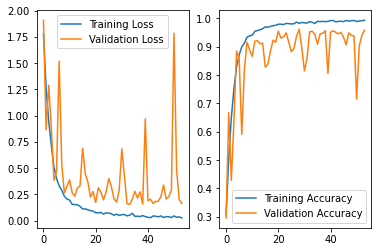

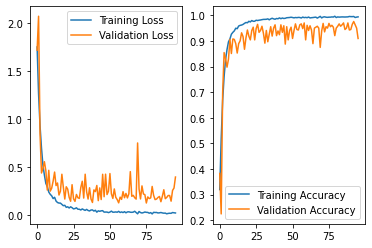

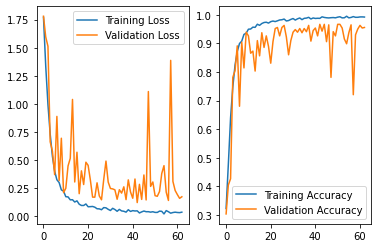

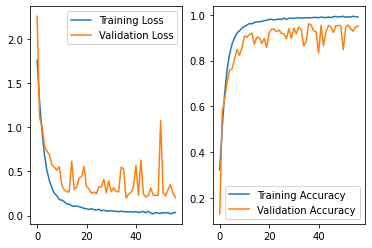

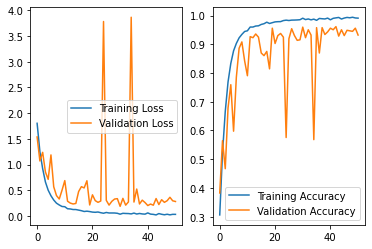

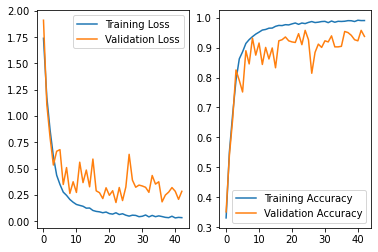

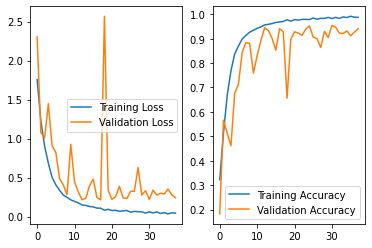

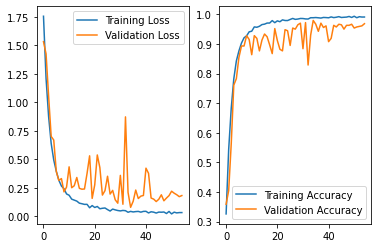

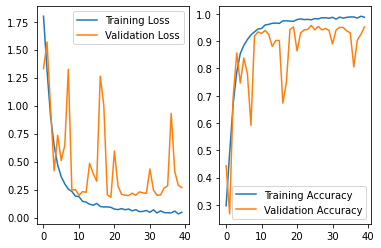

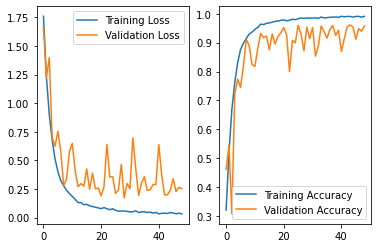

In [15]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [16]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.975      0.91604396 0.84141525 0.93043231 0.9803612  0.95522873
 0.83897436 0.94175828]
precision sdev by class [0.075      0.05972057 0.12218283 0.0543425  0.01437746 0.04630087
 0.08200498 0.022622  ]
macro precision mean 0.9224017618273889
macro precision sdev 0.02711036230156111
recall mean [0.93333333 0.91153846 0.81212121 0.92977011 0.98079143 0.91068376
 0.90128205 0.9452439 ]
recall sdev [0.2        0.08498366 0.06226886 0.05258906 0.01436443 0.03424763
 0.08068779 0.04592059]
macro recall mean 0.9155955331912733
macro recall sdev 0.0212116722042662
f1 mean [0.93571429 0.91048185 0.81862932 0.92827422 0.98048008 0.93158514
 0.86560451 0.94250691]
f1 sdev [0.15135443 0.04973607 0.05020542 0.03576148 0.01074354 0.02932108
 0.06338017 0.02052356]
macro f1 mean 0.9141595404105562
macro f1 sdev 0.023488196516526554
accuracy mean 0.9519460517920397
accuracy sdev 0.01529976053514369


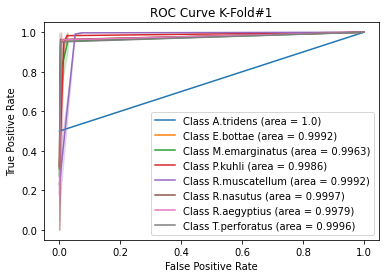

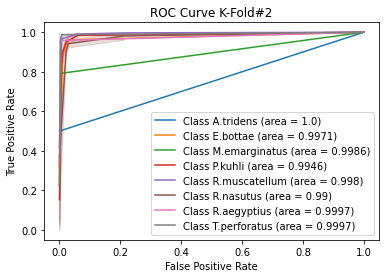

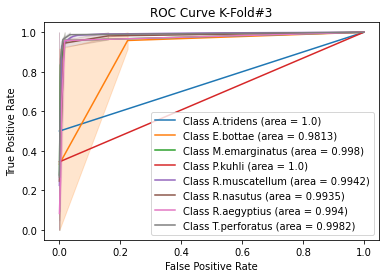

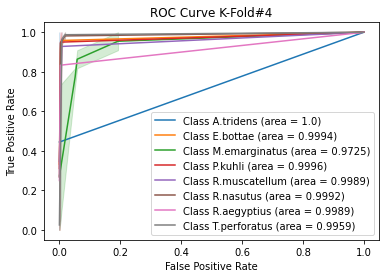

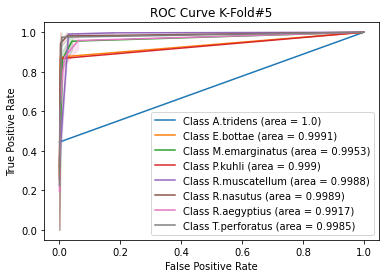

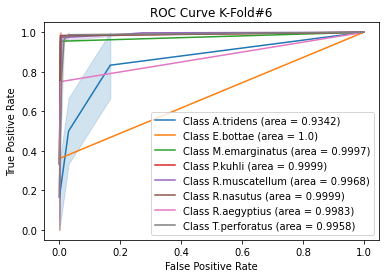

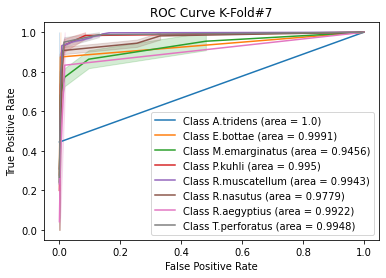

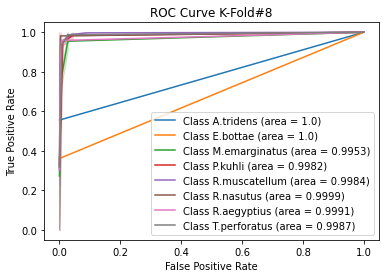

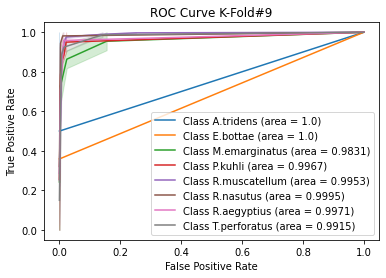

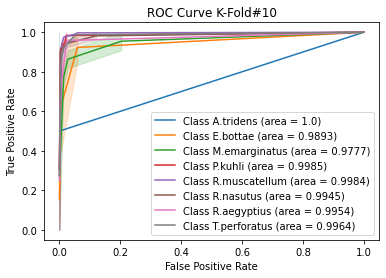

In [17]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [18]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9934225195094761
Std  0.019732441471571906
Sp:  E.bottae
AUC Mean  0.9964612850393187
Std  0.005906082039958374
Sp:  M.emarginatus
AUC Mean  0.9862084047011171
Std  0.016292943184626377
Sp:  P.kuhli
AUC Mean  0.9980088046650923
Std  0.001852060525202506
Sp:  R.muscatellum
AUC Mean  0.9972340724881444
Std  0.001845915805911113
Sp:  R.nasutus
AUC Mean  0.9952907399146689
Std  0.006644389487569602
Sp:  R.aegyptius
AUC Mean  0.9964224099688245
Std  0.0027806089109870553
Sp:  T.perforatus
AUC Mean  0.996899335583248
Std  0.002434589254036363


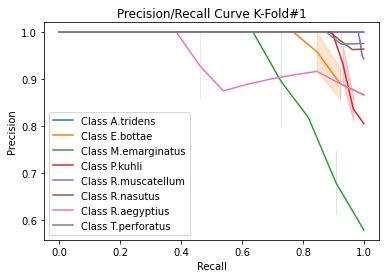

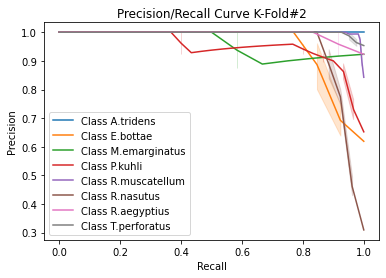

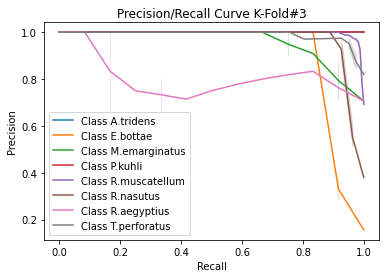

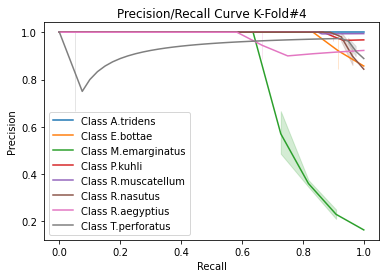

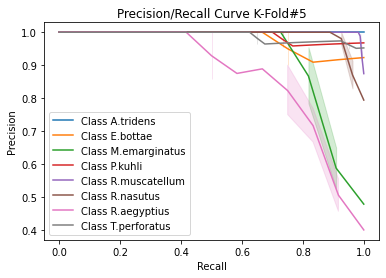

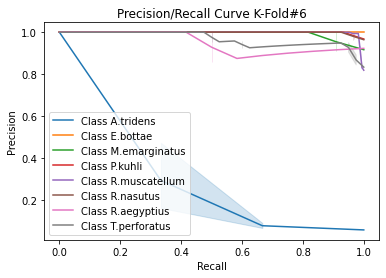

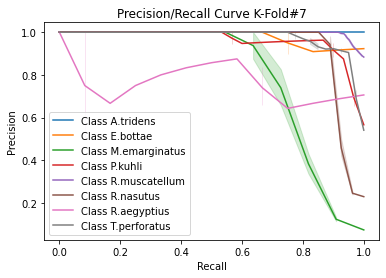

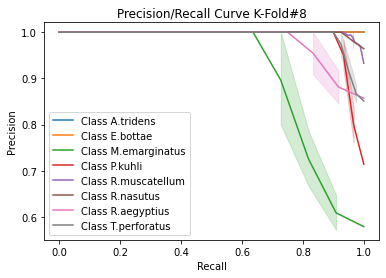

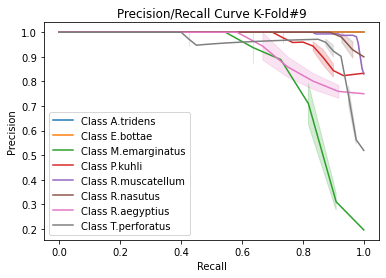

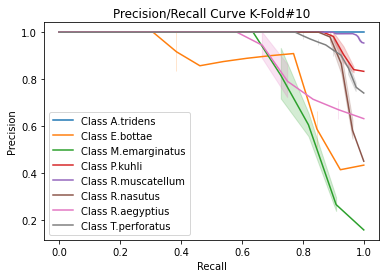

In [19]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0  10   0   0   0   1   0]
 [  0   1   1  27   0   0   0   0]
 [  0   0   0   1 164   0   0   1]
 [  0   1   0   3   0  23   0   0]
 [  0   0   1   0   0   0  11   1]
 [  0   0   0   0   1   0   0  40]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   2   0   0   0]
 [  0   0   9   0   0   1   1   1]
 [  0   0   0  26   1   2   0   1]
 [  0   0   1   0 164   0   1   0]
 [  0   1   0   2   0  23   0   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   1   0   0  40]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0  11   0   1   0   0   0]
 [  0   0   1  27   0   2   0   0]
 [  0   0   1   0 162   0   1   2]
 [  0   0   1   0   1  25   0   0]
 [  0   0   0   0   2   0  10   0]
 [  0   0   0   0   2   0   0  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

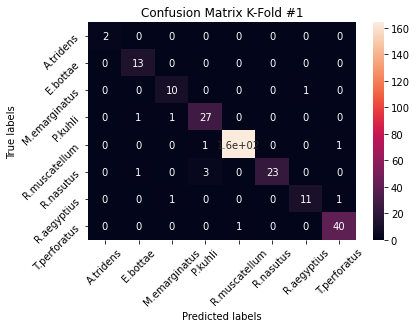

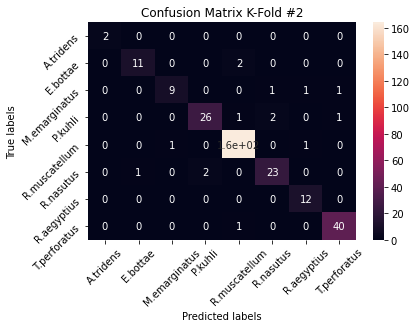

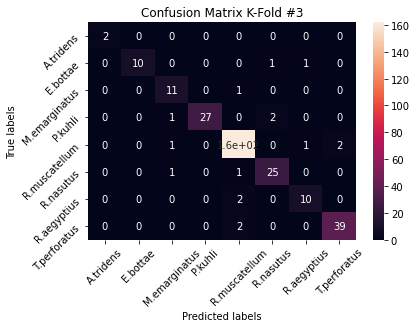

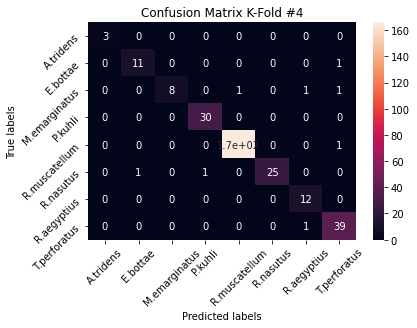

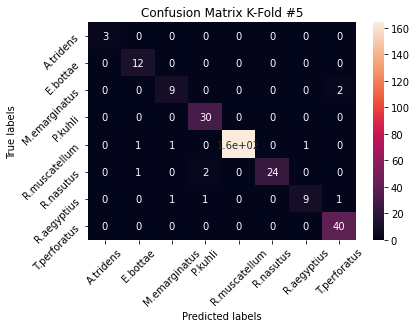

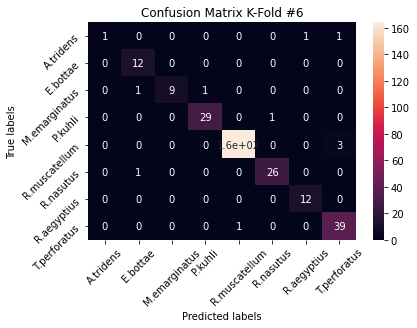

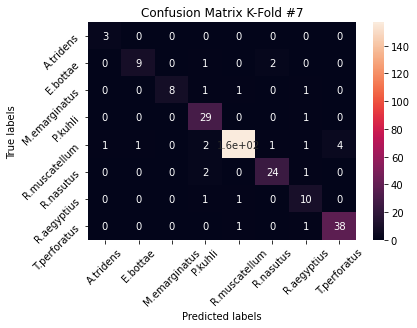

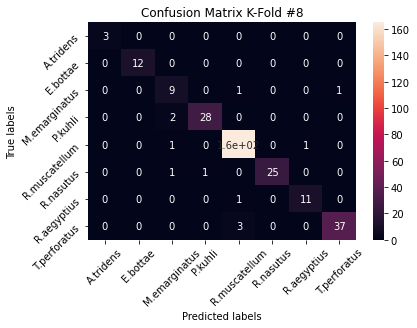

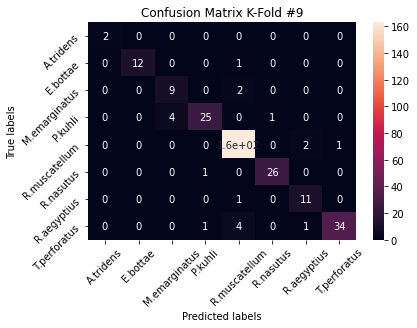

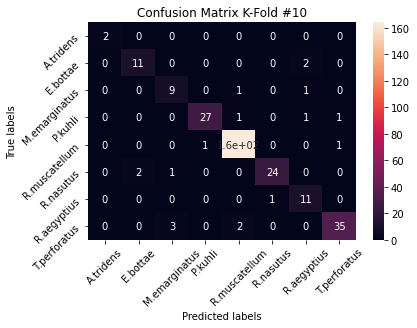

In [20]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  23    0    0    0    0    0    1    1]
 [   0  113    0    1    3    3    3    1]
 [   0    1   91    2    7    1    5    5]
 [   0    1    8  278    2    6    2    2]
 [   1    2    4    4 1633    1    7   13]
 [   0    7    3   12    1  245    1    0]
 [   0    0    2    2    5    1  109    2]
 [   0    0    3    1   15    0    3  381]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   9   0   0   0   0   0]
 [  0   0   0  27   0   0   0   0]
 [  0   0   0   0 163   0   0   1]
 [  0   0   0   1   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   1   0   0  38]]


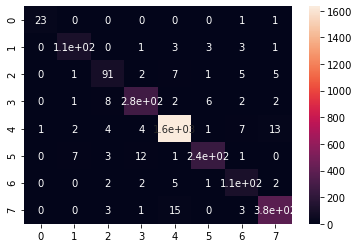

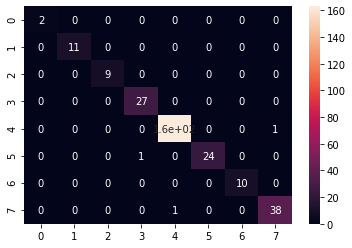

In [21]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.92 0.   0.   0.   0.   0.   0.04 0.04]
 [0.   0.91 0.   0.01 0.02 0.02 0.02 0.01]
 [0.   0.01 0.81 0.02 0.06 0.01 0.04 0.04]
 [0.   0.   0.03 0.93 0.01 0.02 0.01 0.01]
 [0.   0.   0.   0.   0.98 0.   0.   0.01]
 [0.   0.03 0.01 0.04 0.   0.91 0.   0.  ]
 [0.   0.   0.02 0.02 0.04 0.01 0.9  0.02]
 [0.   0.   0.01 0.   0.04 0.   0.01 0.95]]


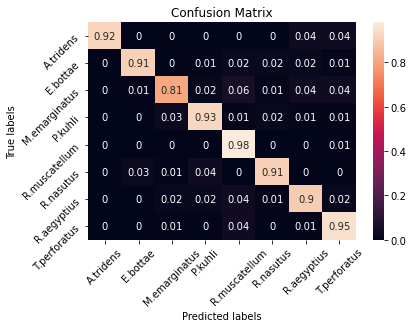

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V2 !!!!! K-Fold Training and Evaluation</h2>

In [23]:
folder = "models"
mode_version = "stft_smote_v2"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/stft_smote_v2


In [24]:
def build_current_model():
    inp = inp = Input(shape=(112,170,3))
    c1 = Convolution2D(filters=120 ,kernel_size=(7,7),strides=(1,1),padding='same')(inp)
    bt = BatchNormalization()(c1)
    bt = Activation('relu')(bt)
    mpool = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(0.2)(mpool)


    c2 = Convolution2D(filters=96,kernel_size=(5,5),strides=(2,2),padding='same')(mpool)
    bt = BatchNormalization()(c2)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(0.3)(mpool)

    c2 = Convolution2D(filters=112,kernel_size=(3,3),strides=(1,1),padding='same')(mpool)
    bt = BatchNormalization()(c2)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(rate=0.3)(mpool)

    c3 = Convolution2D(filters=120,kernel_size=(3,3),strides=(1,1 ),padding='same')(mpool)
    bt = BatchNormalization()(c3)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(rate=0.4)(mpool)

    f = Flatten()(mpool)

    x_out = Dense(8, name='output', activation='softmax')(f)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
            optimizer=Adam(lr=0.003),
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )
    return model


In [25]:
model = build_current_model()
model.summary()

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 112, 170, 120)     17760     
_________________________________________________________________
batch_normalization_77 (Batc (None, 112, 170, 120)     480       
_________________________________________________________________
activation_77 (Activation)   (None, 112, 170, 120)     0         
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 56, 85, 120)       0         
_________________________________________________________________
dropout_33 (Dropout)         (None, 56, 85, 120)       0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 28, 43, 96)        288

In [26]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 19s - loss: 1.6478 - accuracy: 0.3874 - val_loss: 2.1000 - val_accuracy: 0.1599
Epoch 2/100
1199/1199 - 19s - loss: 0.8728 - accuracy: 0.6566 - val_loss: 0.8794 - val_accuracy: 0.6857
Epoch 3/100
1199/1199 - 20s - loss: 0.3737 - accuracy: 0.8693 - val_loss: 0.6102 - val_accuracy: 0.7886
Epoch 4/100
1199/1199 - 20s - loss: 0.2276 - accuracy: 0.9251 - val_loss: 0.5116 - val_accuracy: 0.7904
Epoch 5/100
1199/1199 - 20s - loss: 0.1450 - accuracy: 0.9506 - val_loss: 0.3258 - val_accuracy: 0

Epoch 26/100
1199/1199 - 19s - loss: 0.0289 - accuracy: 0.9893 - val_loss: 0.3526 - val_accuracy: 0.9228
Epoch 27/100
1199/1199 - 19s - loss: 0.0361 - accuracy: 0.9912 - val_loss: 0.1449 - val_accuracy: 0.9669
Epoch 28/100
1199/1199 - 19s - loss: 0.0273 - accuracy: 0.9924 - val_loss: 0.2042 - val_accuracy: 0.9522
Epoch 29/100
1199/1199 - 19s - loss: 0.0304 - accuracy: 0.9924 - val_loss: 0.1345 - val_accuracy: 0.9688
Epoch 30/100
1199/1199 - 19s - loss: 0.0302 - accuracy: 0.9922 - val_loss: 0.1212 - val_accuracy: 0.9724
Epoch 31/100
1199/1199 - 19s - loss: 0.0281 - accuracy: 0.9918 - val_loss: 0.2019 - val_accuracy: 0.9449
Epoch 32/100
1199/1199 - 19s - loss: 0.0252 - accuracy: 0.9918 - val_loss: 0.3760 - val_accuracy: 0.9246
Epoch 33/100
1199/1199 - 19s - loss: 0.0250 - accuracy: 0.9928 - val_loss: 0.1355 - val_accuracy: 0.9743
Epoch 34/100
1199/1199 - 19s - loss: 0.0320 - accuracy: 0.9902 - val_loss: 0.1476 - val_accuracy: 0.9559
Epoch 35/100
1199/1199 - 19s - loss: 0.0227 - accuracy:

Epoch 48/100
1199/1199 - 19s - loss: 0.0214 - accuracy: 0.9941 - val_loss: 0.3814 - val_accuracy: 0.9430
Epoch 49/100
1199/1199 - 19s - loss: 0.0260 - accuracy: 0.9947 - val_loss: 0.5122 - val_accuracy: 0.9228
Epoch 50/100
Restoring model weights from the end of the best epoch.
1199/1199 - 19s - loss: 0.0244 - accuracy: 0.9934 - val_loss: 1.3799 - val_accuracy: 0.8401
Epoch 00050: early stopping
models/stft_smote_v2_iter_3.model
INFO:tensorflow:Assets written to: models/stft_smote_v2_iter_3.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch

Epoch 29/100
1198/1198 - 19s - loss: 0.0401 - accuracy: 0.9897 - val_loss: 0.9429 - val_accuracy: 0.8199
Epoch 30/100
1198/1198 - 19s - loss: 0.0196 - accuracy: 0.9949 - val_loss: 0.3992 - val_accuracy: 0.9485
Epoch 31/100
1198/1198 - 19s - loss: 0.0227 - accuracy: 0.9932 - val_loss: 0.3939 - val_accuracy: 0.9393
Epoch 32/100
1198/1198 - 19s - loss: 0.0225 - accuracy: 0.9935 - val_loss: 1.4109 - val_accuracy: 0.8290
Epoch 33/100
Restoring model weights from the end of the best epoch.
1198/1198 - 19s - loss: 0.0264 - accuracy: 0.9915 - val_loss: 0.6827 - val_accuracy: 0.8695
Epoch 00033: early stopping
models/stft_smote_v2_iter_5.model
INFO:tensorflow:Assets written to: models/stft_smote_v2_iter_5.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bot

Epoch 23/100
1198/1198 - 19s - loss: 0.0383 - accuracy: 0.9894 - val_loss: 0.2942 - val_accuracy: 0.9632
Epoch 24/100
1198/1198 - 19s - loss: 0.0297 - accuracy: 0.9903 - val_loss: 0.4480 - val_accuracy: 0.9246
Epoch 25/100
1198/1198 - 19s - loss: 0.0365 - accuracy: 0.9902 - val_loss: 6.4532 - val_accuracy: 0.6599
Epoch 26/100
1198/1198 - 19s - loss: 0.0367 - accuracy: 0.9899 - val_loss: 0.3342 - val_accuracy: 0.9577
Epoch 27/100
1198/1198 - 19s - loss: 0.0228 - accuracy: 0.9937 - val_loss: 0.3455 - val_accuracy: 0.9669
Epoch 28/100
1198/1198 - 19s - loss: 0.0182 - accuracy: 0.9949 - val_loss: 0.3213 - val_accuracy: 0.9724
Epoch 29/100
1198/1198 - 19s - loss: 0.0345 - accuracy: 0.9908 - val_loss: 0.3171 - val_accuracy: 0.9688
Epoch 30/100
1198/1198 - 19s - loss: 0.0240 - accuracy: 0.9931 - val_loss: 0.4074 - val_accuracy: 0.9688
Epoch 31/100
1198/1198 - 19s - loss: 0.0361 - accuracy: 0.9888 - val_loss: 0.4964 - val_accuracy: 0.9228
Epoch 32/100
1198/1198 - 19s - loss: 0.0202 - accuracy:

Epoch 56/100
1198/1198 - 19s - loss: 0.0130 - accuracy: 0.9967 - val_loss: 0.1925 - val_accuracy: 0.9706
Epoch 57/100
1198/1198 - 19s - loss: 0.0264 - accuracy: 0.9934 - val_loss: 0.2719 - val_accuracy: 0.9522
Epoch 58/100
1198/1198 - 19s - loss: 0.0185 - accuracy: 0.9959 - val_loss: 0.1588 - val_accuracy: 0.9688
Epoch 59/100
Restoring model weights from the end of the best epoch.
1198/1198 - 19s - loss: 0.0099 - accuracy: 0.9968 - val_loss: 0.2027 - val_accuracy: 0.9724
Epoch 00059: early stopping
models/stft_smote_v2_iter_8.model
INFO:tensorflow:Assets written to: models/stft_smote_v2_iter_8.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.

Epoch 27/100
1199/1199 - 19s - loss: 0.0316 - accuracy: 0.9911 - val_loss: 0.3099 - val_accuracy: 0.9430
Epoch 28/100
1199/1199 - 19s - loss: 0.0381 - accuracy: 0.9896 - val_loss: 0.2505 - val_accuracy: 0.9357
Epoch 29/100
1199/1199 - 19s - loss: 0.0253 - accuracy: 0.9922 - val_loss: 0.2094 - val_accuracy: 0.9283
Epoch 30/100
1199/1199 - 19s - loss: 0.0240 - accuracy: 0.9923 - val_loss: 0.6903 - val_accuracy: 0.8787
Epoch 31/100
1199/1199 - 19s - loss: 0.0363 - accuracy: 0.9905 - val_loss: 0.3359 - val_accuracy: 0.9228
Epoch 32/100
1199/1199 - 19s - loss: 0.0297 - accuracy: 0.9912 - val_loss: 0.3194 - val_accuracy: 0.9467
Epoch 33/100
1199/1199 - 19s - loss: 0.0317 - accuracy: 0.9917 - val_loss: 0.7747 - val_accuracy: 0.8934
Epoch 34/100
1199/1199 - 19s - loss: 0.0195 - accuracy: 0.9945 - val_loss: 0.2886 - val_accuracy: 0.9320
Epoch 35/100
1199/1199 - 19s - loss: 0.0285 - accuracy: 0.9921 - val_loss: 0.2393 - val_accuracy: 0.9485
Epoch 36/100
1199/1199 - 19s - loss: 0.0256 - accuracy:

## LOAD AND EVAL

In [27]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [28]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
   
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

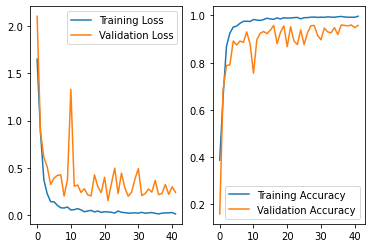

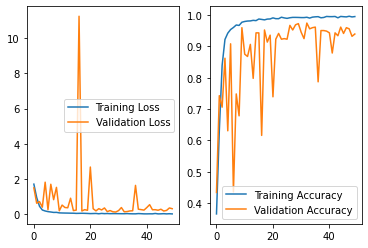

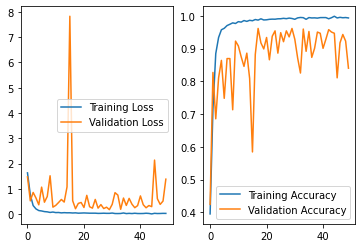

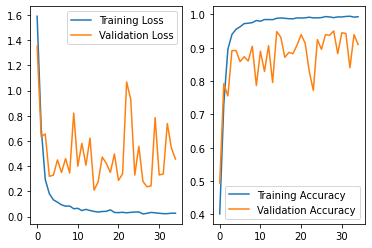

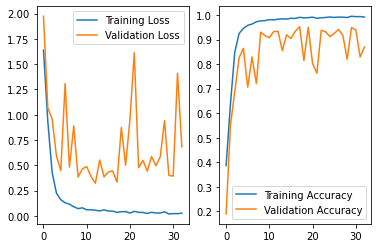

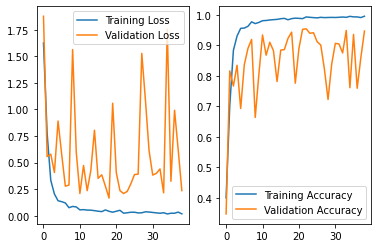

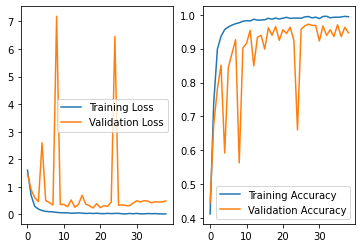

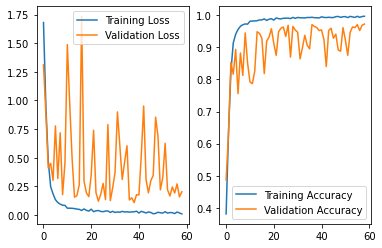

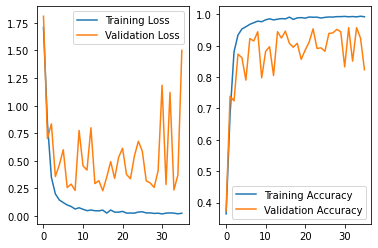

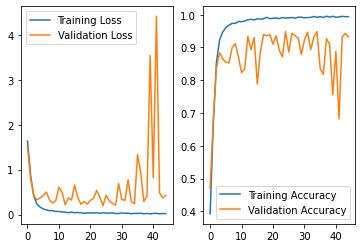

In [29]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [30]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [0.96666667 0.90302198 0.84833333 0.93478696 0.98689059 0.95828243
 0.80244755 0.92528034]
precision sdev by class [0.1        0.12739504 0.08854273 0.05478944 0.01363933 0.04747004
 0.08506487 0.04805525]
macro precision mean 0.9157137307488659
macro precision sdev 0.026233555977234743
recall mean [0.93333333 0.89423077 0.78409091 0.93       0.97716976 0.92179487
 0.91794872 0.94786585]
recall sdev [0.2        0.06456564 0.07493876 0.05666667 0.01033433 0.06940831
 0.0731893  0.02081806]
macro recall mean 0.913304276491117
macro recall sdev 0.032143786061438306
f1 mean [0.93       0.8911202  0.81117092 0.92970736 0.98191435 0.93677177
 0.85223857 0.93568264]
f1 sdev [0.15524175 0.07509644 0.05890122 0.02775385 0.00754769 0.03497355
 0.05685555 0.02771207]
macro f1 mean 0.9085757259456979
macro f1 sdev 0.028766160083975617
accuracy mean 0.950290422652967
accuracy sdev 0.013693947525973752


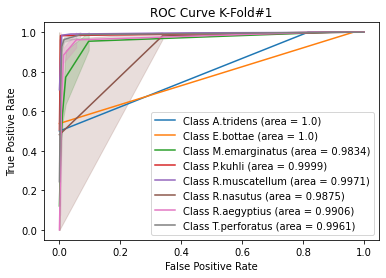

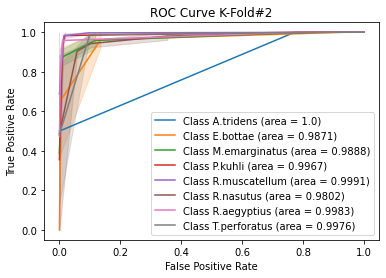

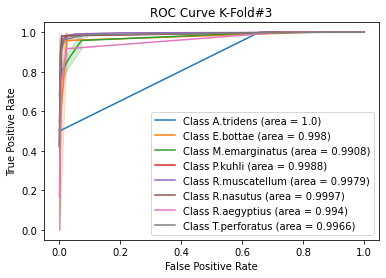

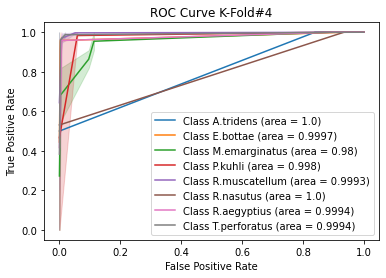

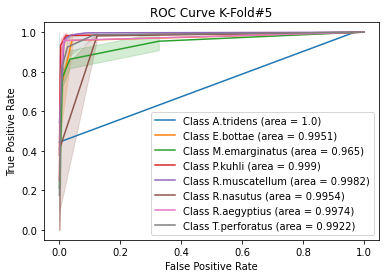

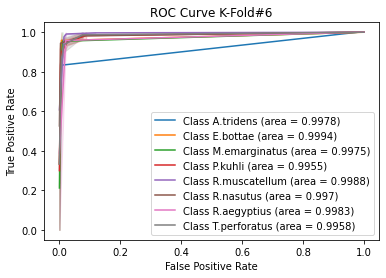

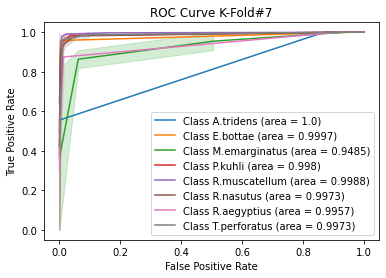

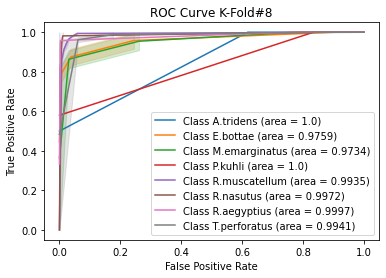

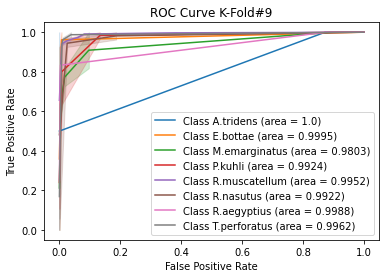

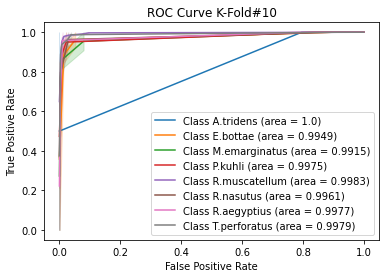

In [31]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [32]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9997770345596433
Std  0.0006688963210702447
Sp:  E.bottae
AUC Mean  0.9949297881502421
Std  0.007393657821170742
Sp:  M.emarginatus
AUC Mean  0.9799244578741556
Std  0.013813320204092405
Sp:  P.kuhli
AUC Mean  0.9975817000432559
Std  0.002177237402255466
Sp:  R.muscatellum
AUC Mean  0.9976216922010771
Std  0.001780423360790314
Sp:  R.nasutus
AUC Mean  0.9942660636259493
Std  0.005841261902838715
Sp:  R.aegyptius
AUC Mean  0.9969849384597028
Std  0.002703156630056735
Sp:  T.perforatus
AUC Mean  0.9963159378698287
Std  0.0019322820871557512


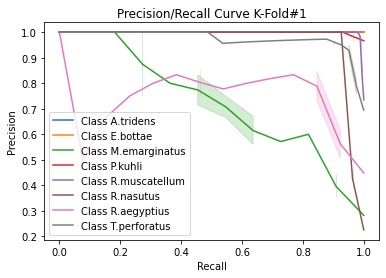

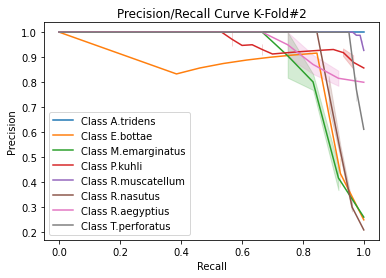

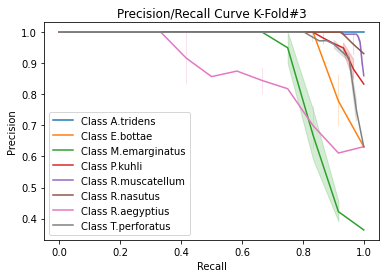

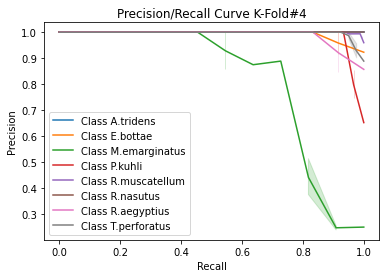

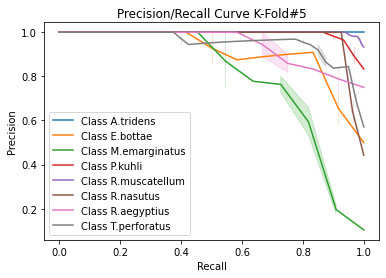

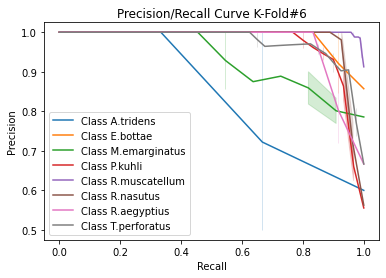

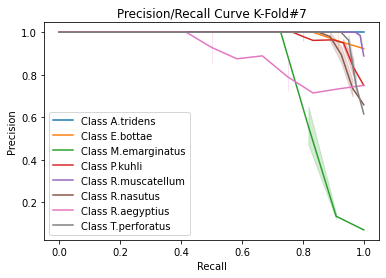

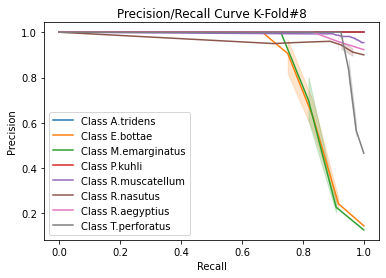

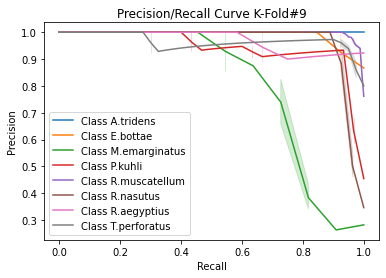

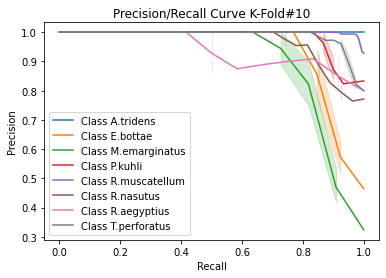

In [33]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  1   0   7   1   0   0   1   1]
 [  0   0   0  29   0   0   0   0]
 [  0   0   0   2 163   0   0   1]
 [  0   0   0   0   0  26   1   0]
 [  0   0   2   0   0   0  11   0]
 [  0   0   1   1   0   0   0  39]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   1   1]
 [  0   0  11   0   0   0   1   0]
 [  0   0   3  27   0   0   0   0]
 [  0   0   1   0 161   0   3   1]
 [  0   1   0   2   0  23   0   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   1   0   1  39]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   1   0]
 [  0   0  10   0   0   0   2   0]
 [  0   0   0  26   0   2   0   2]
 [  0   0   0   0 163   0   2   1]
 [  0   0   0   0   0  27   0   0]
 [  0   0   1   0   0   0  10   1]
 [  0   0   1   0   1   0   0  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

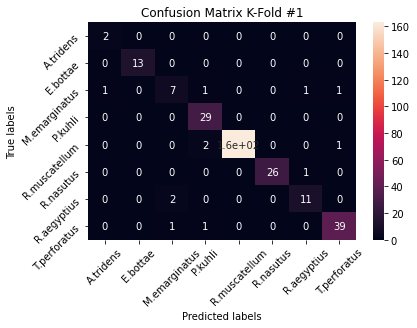

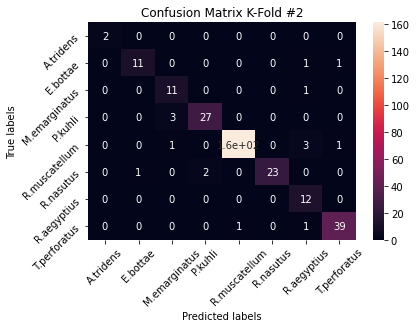

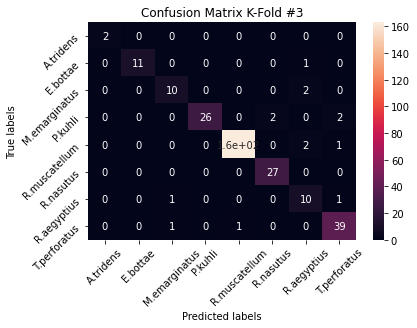

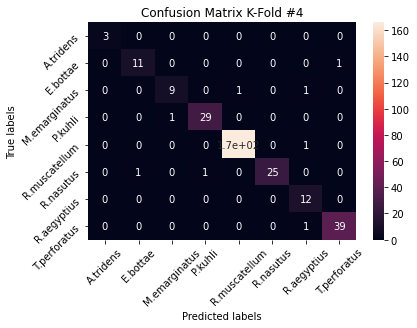

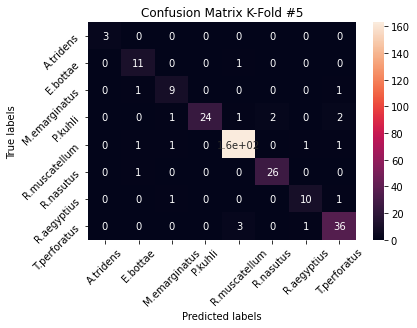

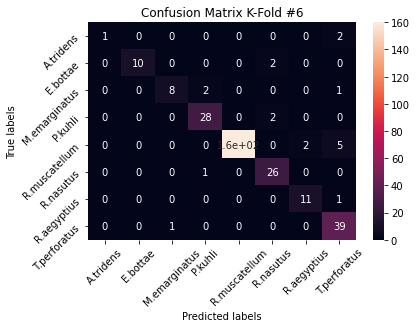

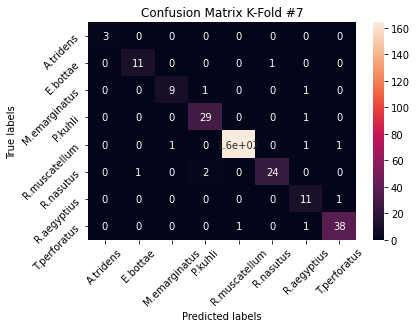

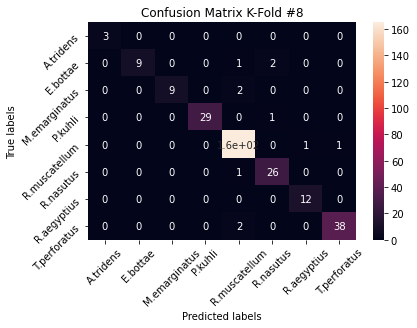

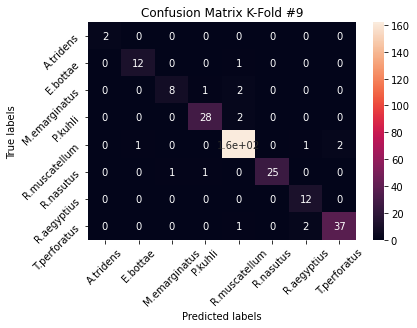

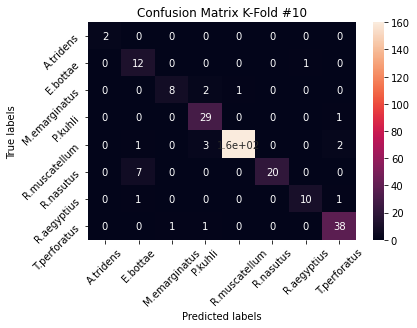

In [34]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  23    0    0    0    0    0    0    2]
 [   0  111    0    0    3    5    3    2]
 [   1    1   88    7    6    0    6    3]
 [   0    0    5  278    3    7    1    5]
 [   0    3    3    5 1627    0   12   15]
 [   0   11    1    7    1  248    1    0]
 [   0    1    4    0    0    0  111    5]
 [   0    0    4    2    9    0    6  382]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   8   0   0   0   0   0]
 [  0   0   0  27   0   0   0   0]
 [  0   0   0   0 162   0   1   1]
 [  0   1   0   0   0  24   0   0]
 [  0   0   0   0   0   0  11   0]
 [  0   0   0   0   0   0   0  38]]


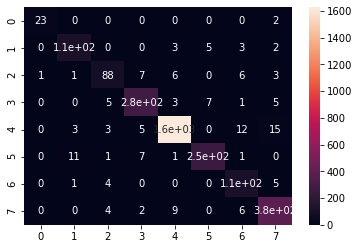

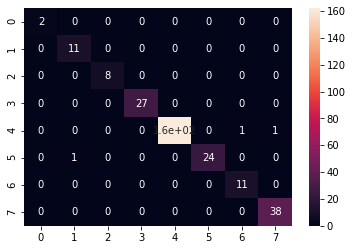

In [35]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.92 0.   0.   0.   0.   0.   0.   0.08]
 [0.   0.9  0.   0.   0.02 0.04 0.02 0.02]
 [0.01 0.01 0.79 0.06 0.05 0.   0.05 0.03]
 [0.   0.   0.02 0.93 0.01 0.02 0.   0.02]
 [0.   0.   0.   0.   0.98 0.   0.01 0.01]
 [0.   0.04 0.   0.03 0.   0.92 0.   0.  ]
 [0.   0.01 0.03 0.   0.   0.   0.92 0.04]
 [0.   0.   0.01 0.   0.02 0.   0.01 0.95]]


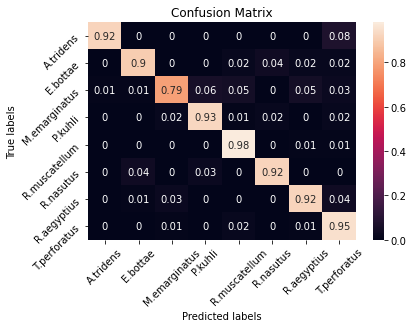

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V3 !!!!! K-Fold Training and Evaluation</h2>

In [37]:
folder = "models"
mode_version = "stft_smote_v3"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/stft_smote_v3


In [38]:
 def build_current_model():
    inp = inp = Input(shape=(112,170,3))
    c1 = Convolution2D(filters=120 ,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    bt = BatchNormalization()(c1)
    bt = Activation('relu')(bt)
    mpool = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(0.2)(mpool)


    c2 = Convolution2D(filters=96,kernel_size=(5,5),strides=(2,2),padding='same')(mpool)
    bt = BatchNormalization()(c2)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(0.3)(mpool)

    c2 = Convolution2D(filters=112,kernel_size=(3,3),strides=(1,1),padding='same')(mpool)
    bt = BatchNormalization()(c2)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(rate=0.3)(mpool)

    c3 = Convolution2D(filters=120,kernel_size=(3,3),strides=(1,1),padding='same')(mpool)
    bt = BatchNormalization()(c3)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(rate=0.4)(mpool)

    f = Flatten()(mpool)

    x_out = Dense(8, name='output', activation='softmax')(f)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
            optimizer=Adam(lr=0.003),
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )
    return model



In [39]:
model = build_current_model()
model.summary()

Model: "model_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_88 (Conv2D)           (None, 56, 85, 120)       17760     
_________________________________________________________________
batch_normalization_121 (Bat (None, 56, 85, 120)       480       
_________________________________________________________________
activation_121 (Activation)  (None, 56, 85, 120)       0         
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 28, 43, 120)       0         
_________________________________________________________________
dropout_77 (Dropout)         (None, 28, 43, 120)       0         
_________________________________________________________________
conv2d_89 (Conv2D)           (None, 14, 22, 96)        288

In [40]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 7s - loss: 1.4042 - accuracy: 0.4748 - val_loss: 0.8689 - val_accuracy: 0.6489
Epoch 2/100
1199/1199 - 7s - loss: 0.5736 - accuracy: 0.7846 - val_loss: 0.6181 - val_accuracy: 0.7757
Epoch 3/100
1199/1199 - 7s - loss: 0.3372 - accuracy: 0.8813 - val_loss: 0.4546 - val_accuracy: 0.8235
Epoch 4/100
1199/1199 - 7s - loss: 0.2467 - accuracy: 0.9161 - val_loss: 1.6848 - val_accuracy: 0.6268
Epoch 5/100
1199/1199 - 7s - loss: 0.2016 - accuracy: 0.9312 - val_loss: 0.2800 - val_accuracy: 0.9044

Epoch 28/100
1199/1199 - 7s - loss: 0.0358 - accuracy: 0.9887 - val_loss: 0.3206 - val_accuracy: 0.8897
Epoch 29/100
1199/1199 - 7s - loss: 0.0484 - accuracy: 0.9847 - val_loss: 0.2256 - val_accuracy: 0.9301
Epoch 30/100
1199/1199 - 7s - loss: 0.0339 - accuracy: 0.9901 - val_loss: 0.2453 - val_accuracy: 0.9246
Epoch 31/100
1199/1199 - 7s - loss: 0.0393 - accuracy: 0.9887 - val_loss: 0.2093 - val_accuracy: 0.9338
Epoch 32/100
1199/1199 - 7s - loss: 0.0353 - accuracy: 0.9887 - val_loss: 0.1662 - val_accuracy: 0.9540
Epoch 33/100
1199/1199 - 7s - loss: 0.0322 - accuracy: 0.9896 - val_loss: 0.2646 - val_accuracy: 0.9062
Epoch 34/100
1199/1199 - 7s - loss: 0.0292 - accuracy: 0.9911 - val_loss: 0.3272 - val_accuracy: 0.9118
Epoch 35/100
1199/1199 - 7s - loss: 0.0317 - accuracy: 0.9895 - val_loss: 0.1366 - val_accuracy: 0.9467
Epoch 36/100
1199/1199 - 7s - loss: 0.0245 - accuracy: 0.9937 - val_loss: 0.2036 - val_accuracy: 0.9320
Epoch 37/100
1199/1199 - 7s - loss: 0.0410 - accuracy: 0.9884 - 

Epoch 40/100
1199/1199 - 7s - loss: 0.0237 - accuracy: 0.9924 - val_loss: 0.2010 - val_accuracy: 0.9449
Epoch 41/100
1199/1199 - 7s - loss: 0.0257 - accuracy: 0.9923 - val_loss: 0.2132 - val_accuracy: 0.9504
Epoch 42/100
1199/1199 - 7s - loss: 0.0305 - accuracy: 0.9904 - val_loss: 0.1104 - val_accuracy: 0.9688
Epoch 43/100
1199/1199 - 7s - loss: 0.0293 - accuracy: 0.9918 - val_loss: 0.2876 - val_accuracy: 0.9338
Epoch 44/100
1199/1199 - 7s - loss: 0.0328 - accuracy: 0.9893 - val_loss: 0.2242 - val_accuracy: 0.9320
Epoch 45/100
1199/1199 - 7s - loss: 0.0298 - accuracy: 0.9909 - val_loss: 0.1568 - val_accuracy: 0.9651
Epoch 46/100
1199/1199 - 7s - loss: 0.0208 - accuracy: 0.9941 - val_loss: 0.4812 - val_accuracy: 0.8456
Epoch 47/100
1199/1199 - 7s - loss: 0.0226 - accuracy: 0.9934 - val_loss: 0.4080 - val_accuracy: 0.8768
Epoch 48/100
1199/1199 - 7s - loss: 0.0246 - accuracy: 0.9907 - val_loss: 0.1320 - val_accuracy: 0.9614
Epoch 49/100
1199/1199 - 7s - loss: 0.0201 - accuracy: 0.9932 - 

Epoch 00042: early stopping
models/stft_smote_v3_iter_4.model
INFO:tensorflow:Assets written to: models/stft_smote_v3_iter_4.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 7s - loss: 1.3855 - accuracy: 0.4856 - val_loss: 0.9551 - val_accuracy: 0.6581
Epoch 2/100
1198/1198 - 7s - loss: 0.5119 - accuracy: 0.8188 - val_loss: 0.7523 - val_accuracy: 0.7408
Epoch 3/100
1198/1198 - 7s - loss: 0.3138 - accuracy: 0.8932 - val_loss: 0.5156 - val_accuracy: 0.7996
Epoch 4/100
1198/1198 - 7s - loss: 0.2193 - accuracy: 0.9233 - val_

Epoch 36/100
Restoring model weights from the end of the best epoch.
1198/1198 - 7s - loss: 0.0318 - accuracy: 0.9901 - val_loss: 0.3074 - val_accuracy: 0.9099
Epoch 00036: early stopping
models/stft_smote_v3_iter_6.model
INFO:tensorflow:Assets written to: models/stft_smote_v3_iter_6.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 8s - loss: 1.3298 - accuracy: 0.5050 - val_loss: 1.3317 - val_accuracy: 0.5312
Epoch 2/100
1198/1198 - 7s - loss: 0.5208 - accuracy: 0.8099 - val_loss: 0.7438 - val_accuracy: 0.6912
Epoch 3/10

Epoch 36/100
1198/1198 - 7s - loss: 0.0278 - accuracy: 0.9905 - val_loss: 0.4389 - val_accuracy: 0.8915
Epoch 37/100
1198/1198 - 7s - loss: 0.0256 - accuracy: 0.9915 - val_loss: 0.2095 - val_accuracy: 0.9449
Epoch 38/100
1198/1198 - 7s - loss: 0.0331 - accuracy: 0.9906 - val_loss: 0.1470 - val_accuracy: 0.9540
Epoch 39/100
1198/1198 - 7s - loss: 0.0295 - accuracy: 0.9910 - val_loss: 0.4780 - val_accuracy: 0.8658
Epoch 40/100
1198/1198 - 7s - loss: 0.0290 - accuracy: 0.9908 - val_loss: 0.2124 - val_accuracy: 0.9449
Epoch 41/100
1198/1198 - 8s - loss: 0.0199 - accuracy: 0.9942 - val_loss: 0.2554 - val_accuracy: 0.9449
Epoch 42/100
1198/1198 - 7s - loss: 0.0368 - accuracy: 0.9903 - val_loss: 0.4417 - val_accuracy: 0.8676
Epoch 43/100
1198/1198 - 7s - loss: 0.0225 - accuracy: 0.9929 - val_loss: 0.2317 - val_accuracy: 0.9338
Epoch 44/100
1198/1198 - 7s - loss: 0.0203 - accuracy: 0.9936 - val_loss: 0.5953 - val_accuracy: 0.8640
Epoch 45/100
1198/1198 - 7s - loss: 0.0283 - accuracy: 0.9911 - 

Epoch 6/100
1199/1199 - 7s - loss: 0.1410 - accuracy: 0.9578 - val_loss: 0.3125 - val_accuracy: 0.8842
Epoch 7/100
1199/1199 - 7s - loss: 0.1197 - accuracy: 0.9605 - val_loss: 0.4201 - val_accuracy: 0.8548
Epoch 8/100
1199/1199 - 7s - loss: 0.1223 - accuracy: 0.9602 - val_loss: 0.3731 - val_accuracy: 0.8621
Epoch 9/100
1199/1199 - 7s - loss: 0.0998 - accuracy: 0.9659 - val_loss: 0.3147 - val_accuracy: 0.9007
Epoch 10/100
1199/1199 - 7s - loss: 0.0867 - accuracy: 0.9736 - val_loss: 0.2426 - val_accuracy: 0.9265
Epoch 11/100
1199/1199 - 7s - loss: 0.0791 - accuracy: 0.9740 - val_loss: 0.2343 - val_accuracy: 0.9393
Epoch 12/100
1199/1199 - 7s - loss: 0.0700 - accuracy: 0.9781 - val_loss: 0.2563 - val_accuracy: 0.9338
Epoch 13/100
1199/1199 - 7s - loss: 0.0740 - accuracy: 0.9765 - val_loss: 0.3509 - val_accuracy: 0.9062
Epoch 14/100
1199/1199 - 7s - loss: 0.0630 - accuracy: 0.9802 - val_loss: 0.4836 - val_accuracy: 0.8529
Epoch 15/100
1199/1199 - 7s - loss: 0.0620 - accuracy: 0.9798 - val_

## Load and Eval

In [41]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [42]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

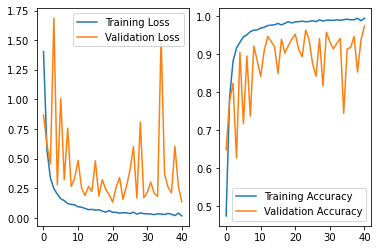

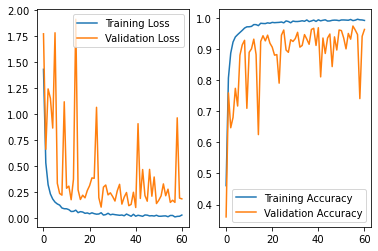

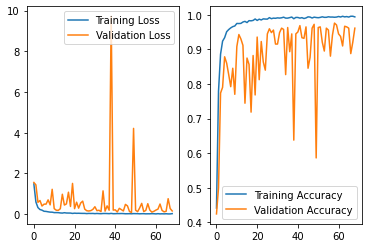

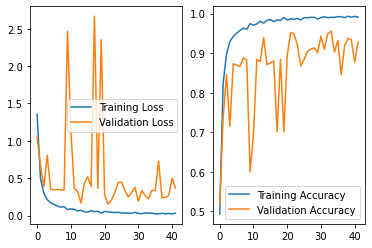

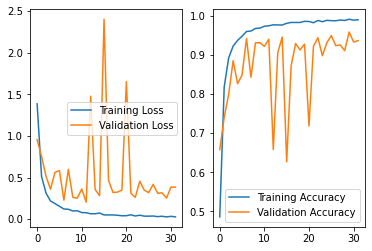

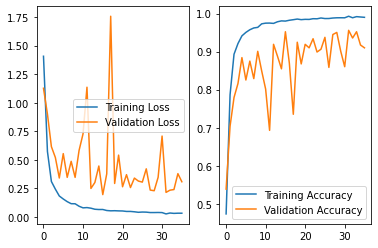

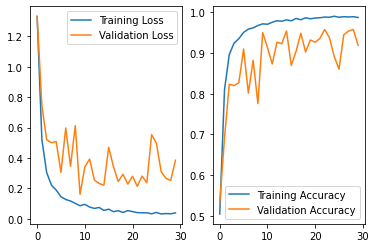

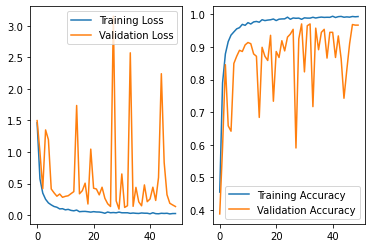

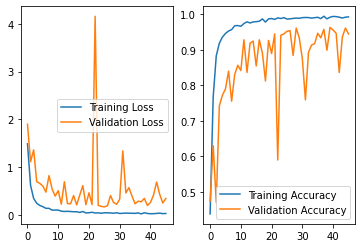

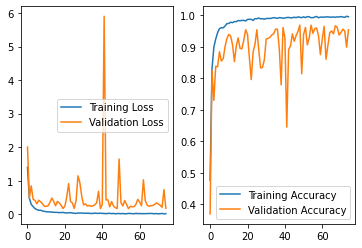

In [43]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [44]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [1.         0.92491342 0.8136791  0.91649494 0.98960723 0.96006919
 0.75911846 0.92609718]
precision sdev by class [0.         0.06921687 0.12547067 0.06261313 0.00772959 0.04243361
 0.07035691 0.03622762]
macro precision mean 0.9112474391577441
macro precision sdev 0.019440338349647313
recall mean [0.93333333 0.89615385 0.83863636 0.96321839 0.96576726 0.91794872
 0.9        0.94768293]
recall sdev [0.2        0.09485447 0.06860559 0.02331946 0.01042349 0.06216835
 0.1280191  0.02367205]
macro recall mean 0.9203426049206913
macro recall sdev 0.027479373991462292
f1 mean [0.95       0.90482725 0.8222331  0.9377681  0.97750051 0.9365166
 0.81881923 0.93635212]
f1 sdev [0.15       0.04694194 0.09296381 0.03152499 0.00670059 0.03423238
 0.07854854 0.02392663]
macro f1 mean 0.9105021144058169
macro f1 sdev 0.024471120430035423
accuracy mean 0.9483135684583397
accuracy sdev 0.008770711974098622


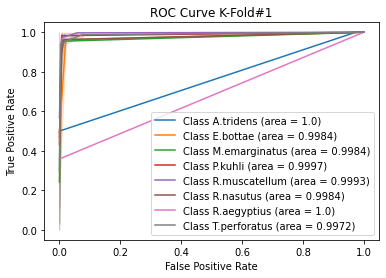

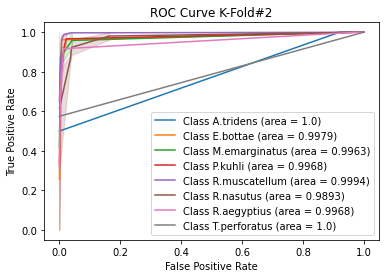

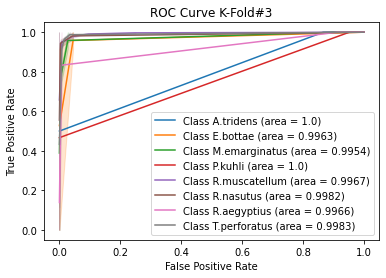

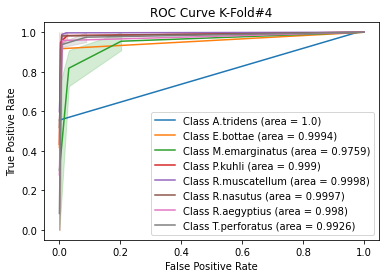

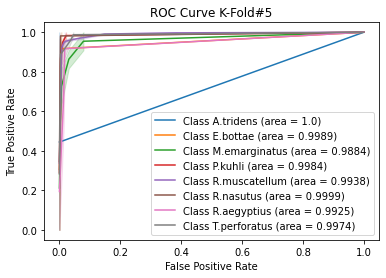

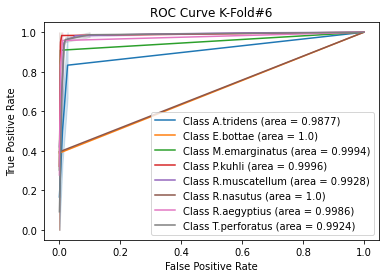

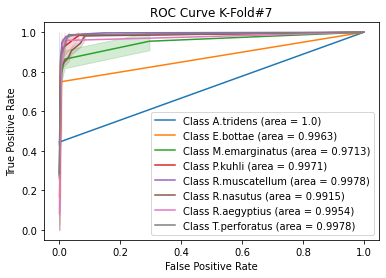

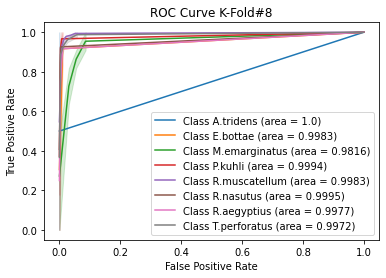

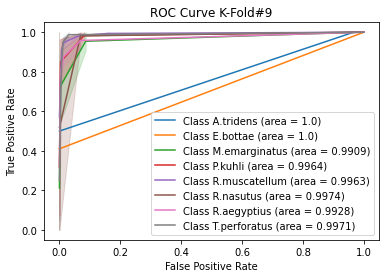

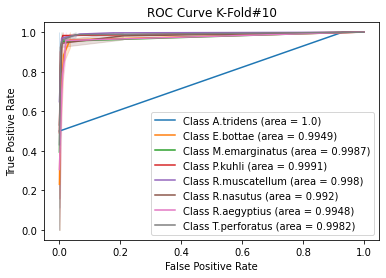

In [45]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [46]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.998773690078038
Std  0.003678929765886296
Sp:  E.bottae
AUC Mean  0.9980279296016528
Std  0.001627313649583745
Sp:  M.emarginatus
AUC Mean  0.9896348393282273
Std  0.009621853862243384
Sp:  P.kuhli
AUC Mean  0.9985576687718458
Std  0.0012622469092357532
Sp:  R.muscatellum
AUC Mean  0.9972294422101541
Std  0.0022346115833579896
Sp:  R.nasutus
AUC Mean  0.9965931785282784
Std  0.0038382646351464355
Sp:  R.aegyptius
AUC Mean  0.9963175635365706
Std  0.002313829836562688
Sp:  T.perforatus
AUC Mean  0.9968206447496168
Std  0.002322774774646866


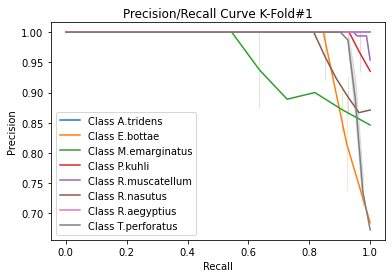

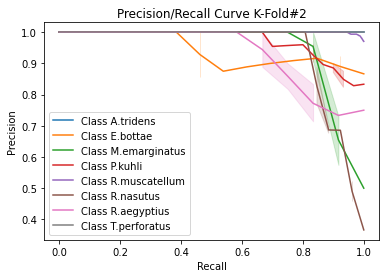

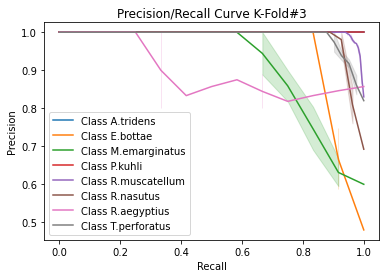

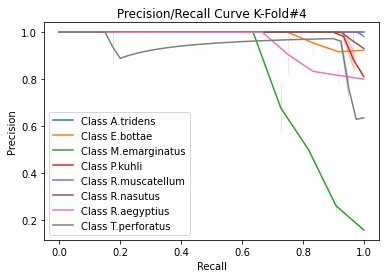

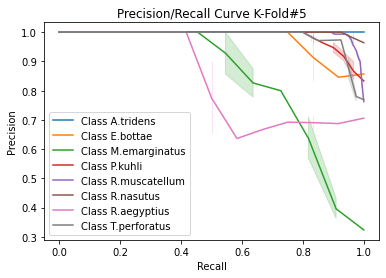

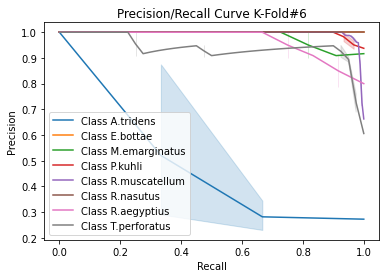

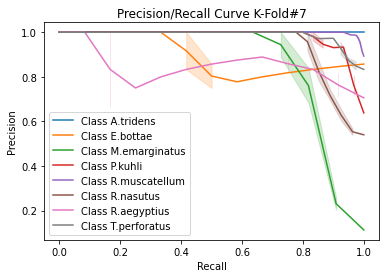

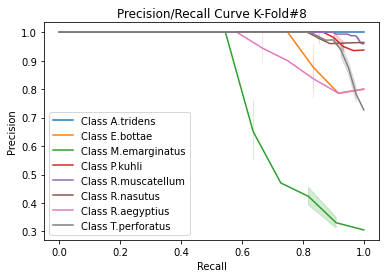

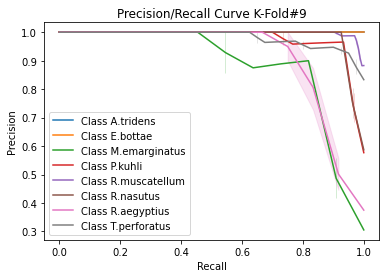

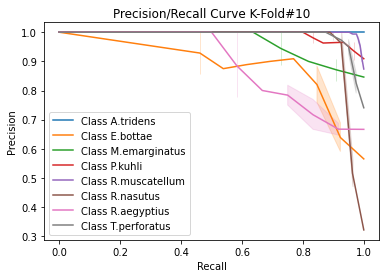

In [47]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   2   0   0]
 [  0   0  10   0   0   0   1   0]
 [  0   0   0  28   0   1   0   0]
 [  0   0   0   0 163   1   0   2]
 [  0   0   0   1   0  26   0   0]
 [  0   0   0   0   0   0  13   0]
 [  0   0   1   0   1   0   0  39]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   1   1   1   0]
 [  0   0  11   0   0   0   1   0]
 [  0   0   1  28   0   1   0   0]
 [  0   0   0   3 160   0   3   0]
 [  0   1   0   3   0  22   0   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   1   0]
 [  0   0  10   0   0   1   1   0]
 [  0   0   0  29   0   1   0   0]
 [  0   0   2   0 157   0   1   6]
 [  0   0   0   0   0  26   1   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   1   0   0   0   0  40]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

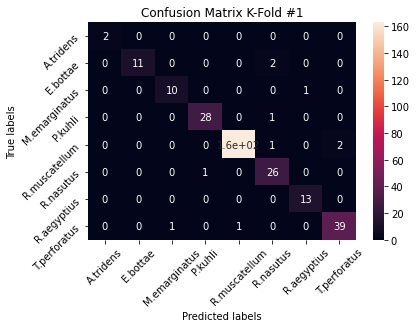

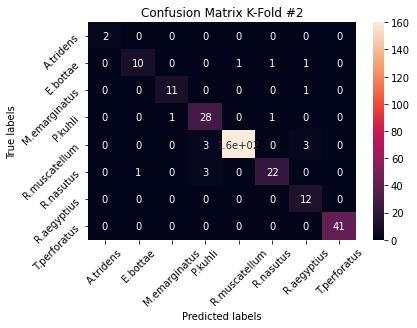

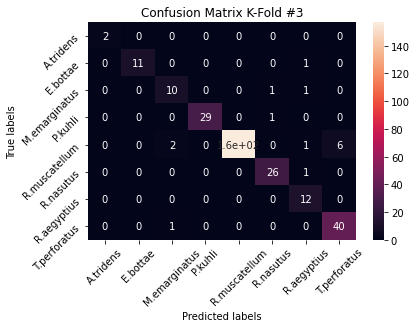

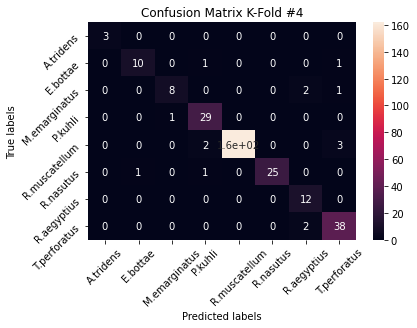

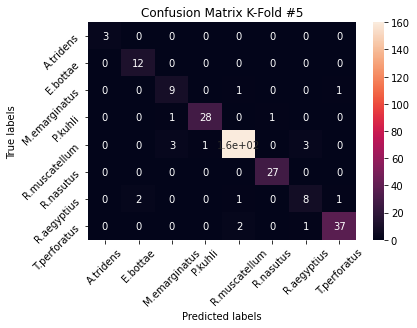

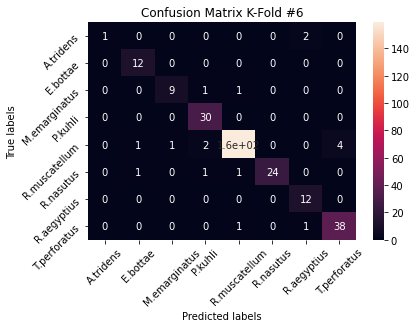

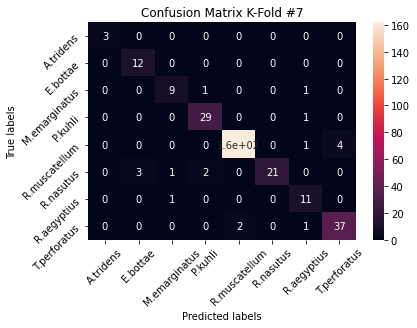

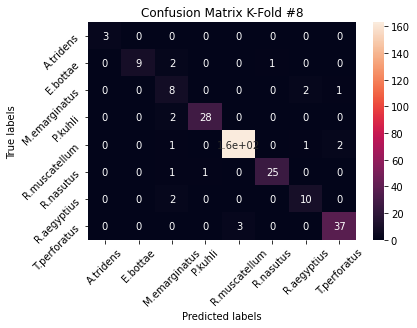

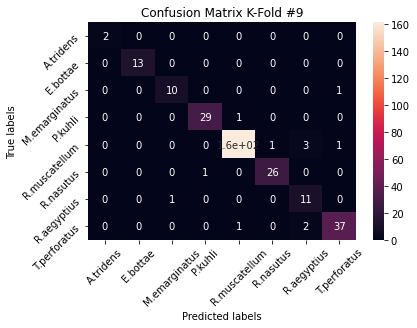

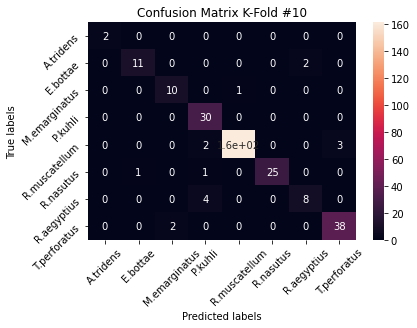

In [48]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  23    0    0    0    0    0    2    0]
 [   0  111    2    1    1    4    4    1]
 [   0    0   94    2    3    1    8    4]
 [   0    0    5  288    1    4    1    0]
 [   0    1    7   10 1608    2   12   25]
 [   0    7    2   11    1  247    1    0]
 [   0    2    4    4    1    0  109    1]
 [   0    0    4    0   10    0    7  382]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   9   0   0   0   0   0]
 [  0   0   0  28   0   0   0   0]
 [  0   0   0   1 160   0   1   2]
 [  0   0   0   1   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   1   0   0  38]]


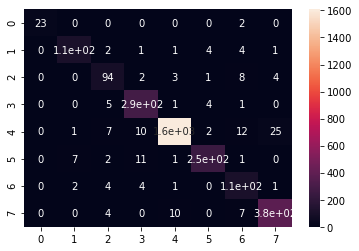

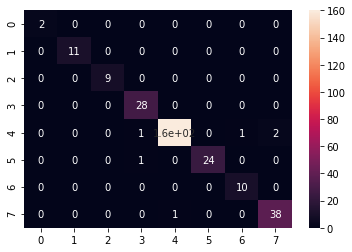

In [49]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.92 0.   0.   0.   0.   0.   0.08 0.  ]
 [0.   0.9  0.02 0.01 0.01 0.03 0.03 0.01]
 [0.   0.   0.84 0.02 0.03 0.01 0.07 0.04]
 [0.   0.   0.02 0.96 0.   0.01 0.   0.  ]
 [0.   0.   0.   0.01 0.97 0.   0.01 0.02]
 [0.   0.03 0.01 0.04 0.   0.92 0.   0.  ]
 [0.   0.02 0.03 0.03 0.01 0.   0.9  0.01]
 [0.   0.   0.01 0.   0.02 0.   0.02 0.95]]


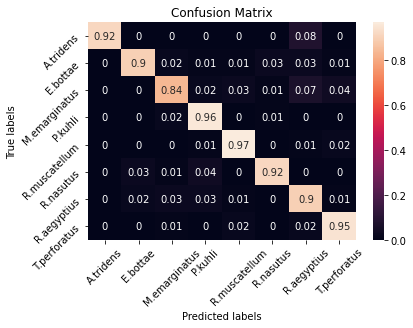

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V4 !!!!! K-Fold Training and Evaluation</h2>

In [51]:
folder = "models"
mode_version = "stft_smote_v4"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/stft_smote_v4


In [52]:
 def build_current_model():
    inp = Input(shape=(112,170,3))
    
    lay = Convolution2D(filters=240,kernel_size=(5,5),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=80,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Flatten()(lay)

    lay = Dense(128)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.4)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [53]:
model = build_current_model()
model.summary()

Model: "model_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_34 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_132 (Conv2D)          (None, 56, 85, 240)       18240     
_________________________________________________________________
batch_normalization_165 (Bat (None, 56, 85, 240)       960       
_________________________________________________________________
activation_165 (Activation)  (None, 56, 85, 240)       0         
_________________________________________________________________
average_pooling2d_99 (Averag (None, 28, 43, 240)       0         
_________________________________________________________________
dropout_121 (Dropout)        (None, 28, 43, 240)       0         
_________________________________________________________________
conv2d_133 (Conv2D)          (None, 14, 22, 80)        480

In [54]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 10s - loss: 1.4994 - accuracy: 0.4358 - val_loss: 1.4155 - val_accuracy: 0.4577
Epoch 2/100
1199/1199 - 10s - loss: 0.8191 - accuracy: 0.6991 - val_loss: 1.1812 - val_accuracy: 0.4706
Epoch 3/100
1199/1199 - 10s - loss: 0.5618 - accuracy: 0.7982 - val_loss: 1.1369 - val_accuracy: 0.5901
Epoch 4/100
1199/1199 - 10s - loss: 0.4240 - accuracy: 0.8489 - val_loss: 0.6779 - val_accuracy: 0.7721
Epoch 5/100
1199/1199 - 10s - loss: 0.3453 - accuracy: 0.8810 - val_loss: 0.8583 - val_accuracy: 0

Epoch 75/100
1199/1199 - 10s - loss: 0.0415 - accuracy: 0.9873 - val_loss: 0.4632 - val_accuracy: 0.9118
Epoch 76/100
1199/1199 - 10s - loss: 0.0597 - accuracy: 0.9829 - val_loss: 0.2874 - val_accuracy: 0.9210
Epoch 77/100
1199/1199 - 10s - loss: 0.0479 - accuracy: 0.9844 - val_loss: 0.2830 - val_accuracy: 0.9228
Epoch 78/100
1199/1199 - 10s - loss: 0.0451 - accuracy: 0.9853 - val_loss: 0.3059 - val_accuracy: 0.9154
Epoch 79/100
1199/1199 - 10s - loss: 0.0457 - accuracy: 0.9858 - val_loss: 0.6225 - val_accuracy: 0.8493
Epoch 80/100
1199/1199 - 10s - loss: 0.0407 - accuracy: 0.9864 - val_loss: 0.2842 - val_accuracy: 0.9228
Epoch 81/100
1199/1199 - 10s - loss: 0.0454 - accuracy: 0.9872 - val_loss: 0.4127 - val_accuracy: 0.8787
Epoch 82/100
1199/1199 - 10s - loss: 0.0374 - accuracy: 0.9884 - val_loss: 0.3315 - val_accuracy: 0.9173
Epoch 83/100
Restoring model weights from the end of the best epoch.
1199/1199 - 10s - loss: 0.0552 - accuracy: 0.9842 - val_loss: 0.3664 - val_accuracy: 0.8842

Epoch 20/100
1199/1199 - 10s - loss: 0.1077 - accuracy: 0.9648 - val_loss: 0.5083 - val_accuracy: 0.8548
Epoch 21/100
1199/1199 - 10s - loss: 0.1026 - accuracy: 0.9676 - val_loss: 0.3823 - val_accuracy: 0.8897
Epoch 22/100
1199/1199 - 10s - loss: 0.1066 - accuracy: 0.9662 - val_loss: 0.5015 - val_accuracy: 0.8548
Epoch 23/100
1199/1199 - 10s - loss: 0.0940 - accuracy: 0.9698 - val_loss: 0.3853 - val_accuracy: 0.8842
Epoch 24/100
1199/1199 - 10s - loss: 0.0912 - accuracy: 0.9686 - val_loss: 0.3331 - val_accuracy: 0.8989
Epoch 25/100
1199/1199 - 10s - loss: 0.0766 - accuracy: 0.9753 - val_loss: 0.5019 - val_accuracy: 0.8732
Epoch 26/100
1199/1199 - 11s - loss: 0.1053 - accuracy: 0.9653 - val_loss: 0.4859 - val_accuracy: 0.8695
Epoch 27/100
1199/1199 - 10s - loss: 0.0950 - accuracy: 0.9689 - val_loss: 0.3516 - val_accuracy: 0.9007
Epoch 28/100
1199/1199 - 10s - loss: 0.0837 - accuracy: 0.9714 - val_loss: 0.4185 - val_accuracy: 0.8658
Epoch 29/100
1199/1199 - 10s - loss: 0.0769 - accuracy:

Epoch 30/100
1198/1198 - 10s - loss: 0.0858 - accuracy: 0.9711 - val_loss: 0.3193 - val_accuracy: 0.8989
Epoch 31/100
1198/1198 - 10s - loss: 0.0655 - accuracy: 0.9800 - val_loss: 0.3907 - val_accuracy: 0.9007
Epoch 32/100
1198/1198 - 10s - loss: 0.0686 - accuracy: 0.9790 - val_loss: 0.5730 - val_accuracy: 0.8143
Epoch 33/100
1198/1198 - 10s - loss: 0.0709 - accuracy: 0.9779 - val_loss: 0.4515 - val_accuracy: 0.8897
Epoch 34/100
1198/1198 - 10s - loss: 0.0638 - accuracy: 0.9773 - val_loss: 0.4095 - val_accuracy: 0.8879
Epoch 35/100
1198/1198 - 10s - loss: 0.0675 - accuracy: 0.9785 - val_loss: 0.3521 - val_accuracy: 0.9081
Epoch 36/100
1198/1198 - 10s - loss: 0.0830 - accuracy: 0.9749 - val_loss: 0.3777 - val_accuracy: 0.8879
Epoch 37/100
1198/1198 - 10s - loss: 0.0661 - accuracy: 0.9784 - val_loss: 0.4273 - val_accuracy: 0.8805
Epoch 38/100
1198/1198 - 10s - loss: 0.0649 - accuracy: 0.9769 - val_loss: 0.3649 - val_accuracy: 0.8934
Epoch 39/100
1198/1198 - 10s - loss: 0.0611 - accuracy:

Epoch 56/100
1198/1198 - 10s - loss: 0.0532 - accuracy: 0.9829 - val_loss: 0.4005 - val_accuracy: 0.9136
Epoch 57/100
1198/1198 - 10s - loss: 0.0527 - accuracy: 0.9823 - val_loss: 0.7877 - val_accuracy: 0.8327
Epoch 58/100
1198/1198 - 10s - loss: 0.0614 - accuracy: 0.9821 - val_loss: 0.3640 - val_accuracy: 0.9118
Epoch 59/100
1198/1198 - 10s - loss: 0.0512 - accuracy: 0.9856 - val_loss: 0.4024 - val_accuracy: 0.8787
Epoch 60/100
1198/1198 - 10s - loss: 0.0493 - accuracy: 0.9854 - val_loss: 0.3819 - val_accuracy: 0.8897
Epoch 61/100
1198/1198 - 10s - loss: 0.0500 - accuracy: 0.9837 - val_loss: 0.4190 - val_accuracy: 0.8915
Epoch 62/100
1198/1198 - 10s - loss: 0.0549 - accuracy: 0.9830 - val_loss: 0.3684 - val_accuracy: 0.8952
Epoch 63/100
1198/1198 - 10s - loss: 0.0450 - accuracy: 0.9859 - val_loss: 0.5701 - val_accuracy: 0.8419
Epoch 64/100
1198/1198 - 10s - loss: 0.0562 - accuracy: 0.9829 - val_loss: 0.7681 - val_accuracy: 0.8199
Epoch 65/100
1198/1198 - 10s - loss: 0.0489 - accuracy:

Epoch 00054: early stopping
models/stft_smote_v4_iter_6.model
INFO:tensorflow:Assets written to: models/stft_smote_v4_iter_6.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 10s - loss: 1.5431 - accuracy: 0.4212 - val_loss: 1.4464 - val_accuracy: 0.3107
Epoch 2/100
1198/1198 - 10s - loss: 0.8368 - accuracy: 0.6888 - val_loss: 0.7519 - val_accuracy: 0.7335
Epoch 3/100
1198/1198 - 10s - loss: 0.5513 - accuracy: 0.8048 - val_loss: 0.9163 - val_accuracy: 0.7279
Epoch 4/100
1198/1198 - 10s - loss: 0.4160 - accuracy: 0.8518 - 

Epoch 17/100
1198/1198 - 10s - loss: 0.1315 - accuracy: 0.9570 - val_loss: 0.7266 - val_accuracy: 0.7721
Epoch 18/100
1198/1198 - 10s - loss: 0.1197 - accuracy: 0.9598 - val_loss: 0.5600 - val_accuracy: 0.8254
Epoch 19/100
1198/1198 - 10s - loss: 0.1050 - accuracy: 0.9657 - val_loss: 0.3483 - val_accuracy: 0.9081
Epoch 20/100
1198/1198 - 10s - loss: 0.1074 - accuracy: 0.9671 - val_loss: 0.5008 - val_accuracy: 0.8732
Epoch 21/100
1198/1198 - 10s - loss: 0.1061 - accuracy: 0.9667 - val_loss: 0.4257 - val_accuracy: 0.8713
Epoch 22/100
1198/1198 - 10s - loss: 0.0948 - accuracy: 0.9697 - val_loss: 1.3887 - val_accuracy: 0.7794
Epoch 23/100
1198/1198 - 10s - loss: 0.1006 - accuracy: 0.9668 - val_loss: 1.3669 - val_accuracy: 0.7684
Epoch 24/100
1198/1198 - 10s - loss: 0.0974 - accuracy: 0.9661 - val_loss: 0.4668 - val_accuracy: 0.8695
Epoch 25/100
1198/1198 - 10s - loss: 0.1050 - accuracy: 0.9674 - val_loss: 0.6240 - val_accuracy: 0.8548
Epoch 26/100
1198/1198 - 10s - loss: 0.0898 - accuracy:

Epoch 28/100
1199/1199 - 10s - loss: 0.0797 - accuracy: 0.9763 - val_loss: 0.3490 - val_accuracy: 0.9099
Epoch 29/100
1199/1199 - 10s - loss: 0.0831 - accuracy: 0.9726 - val_loss: 0.3220 - val_accuracy: 0.9007
Epoch 30/100
1199/1199 - 10s - loss: 0.0910 - accuracy: 0.9721 - val_loss: 1.3252 - val_accuracy: 0.7040
Epoch 31/100
1199/1199 - 10s - loss: 0.0829 - accuracy: 0.9755 - val_loss: 0.4033 - val_accuracy: 0.8603
Epoch 32/100
1199/1199 - 10s - loss: 0.0730 - accuracy: 0.9766 - val_loss: 0.3883 - val_accuracy: 0.8695
Epoch 33/100
1199/1199 - 10s - loss: 0.0906 - accuracy: 0.9729 - val_loss: 0.2888 - val_accuracy: 0.9154
Epoch 34/100
1199/1199 - 10s - loss: 0.0748 - accuracy: 0.9758 - val_loss: 0.3918 - val_accuracy: 0.8934
Epoch 35/100
1199/1199 - 10s - loss: 0.0721 - accuracy: 0.9782 - val_loss: 0.5184 - val_accuracy: 0.8493
Epoch 36/100
1199/1199 - 10s - loss: 0.0791 - accuracy: 0.9735 - val_loss: 0.2575 - val_accuracy: 0.9246
Epoch 37/100
1199/1199 - 10s - loss: 0.0729 - accuracy:

Epoch 55/100
1199/1199 - 10s - loss: 0.0481 - accuracy: 0.9843 - val_loss: 0.4416 - val_accuracy: 0.9136
Epoch 56/100
1199/1199 - 10s - loss: 0.0554 - accuracy: 0.9822 - val_loss: 0.3380 - val_accuracy: 0.9118
Epoch 57/100
1199/1199 - 10s - loss: 0.0482 - accuracy: 0.9838 - val_loss: 0.3505 - val_accuracy: 0.9044
Epoch 58/100
Restoring model weights from the end of the best epoch.
1199/1199 - 10s - loss: 0.0533 - accuracy: 0.9840 - val_loss: 0.7865 - val_accuracy: 0.8732
Epoch 00058: early stopping
models/stft_smote_v4_iter_10.model
INFO:tensorflow:Assets written to: models/stft_smote_v4_iter_10.model/assets


## Load and eval

In [55]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8

In [56]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
        
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

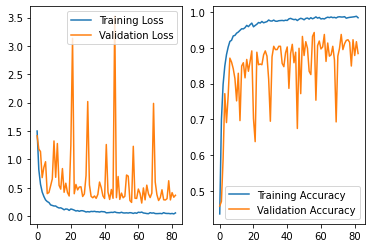

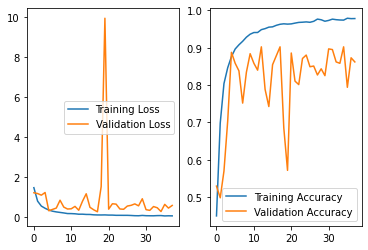

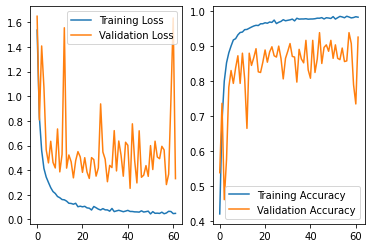

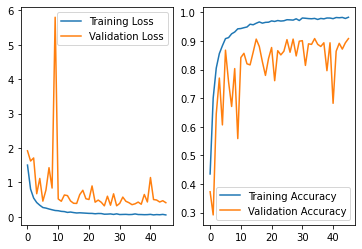

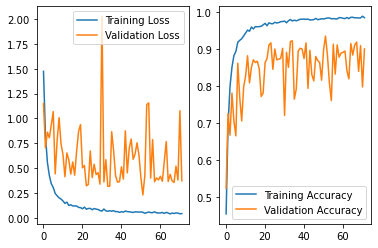

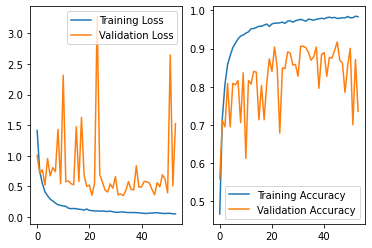

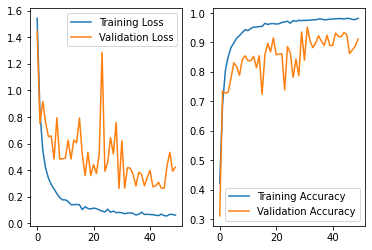

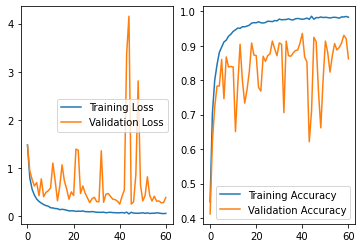

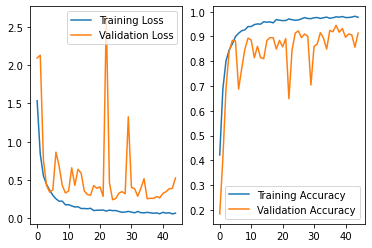

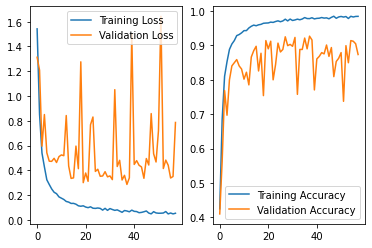

In [57]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [58]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [1.         0.89287587 0.85073954 0.88462954 0.95429747 0.94574613
 0.73832406 0.89258081]
precision sdev by class [0.         0.11416941 0.1404632  0.06654023 0.02235273 0.05260713
 0.16242895 0.05627588]
macro precision mean 0.8948991795633363
macro precision sdev 0.03396462064871266
recall mean [0.8        0.81474359 0.71136364 0.94333333 0.96455883 0.82877493
 0.80320513 0.89060976]
recall sdev [0.25603819 0.10910437 0.11640319 0.04229526 0.01185849 0.05379186
 0.11344705 0.05473708]
macro recall mean 0.844573650832141
macro recall sdev 0.0394925579841256
f1 mean [0.86333333 0.84240579 0.75784931 0.91087014 0.95918375 0.88101675
 0.75628103 0.88971648]
f1 sdev [0.18040079 0.06896375 0.06575343 0.03718062 0.01068352 0.02996955
 0.0976174  0.0380426 ]
macro f1 mean 0.8575820716742604
macro f1 sdev 0.036169556518904786
accuracy mean 0.9171503377263427
accuracy sdev 0.013991466145635881


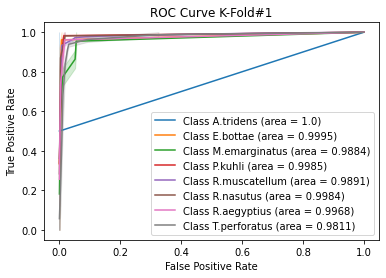

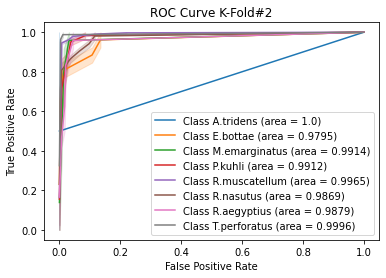

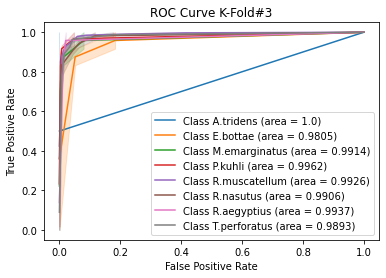

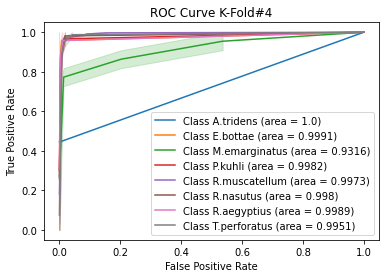

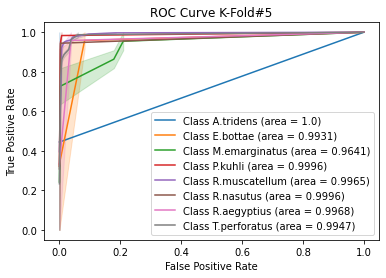

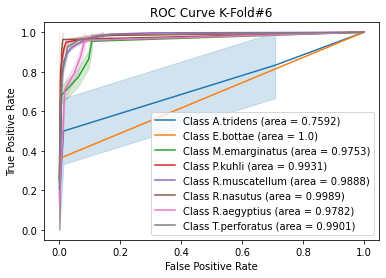

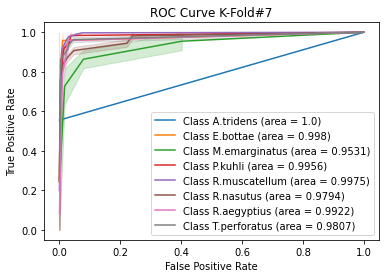

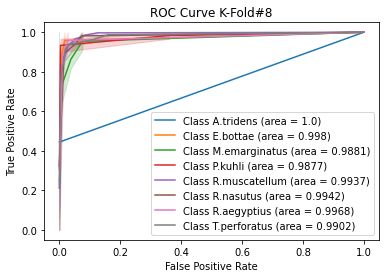

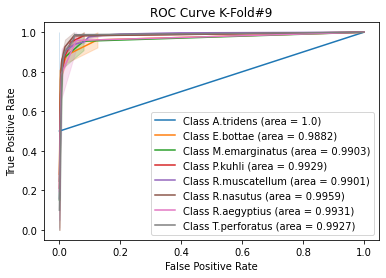

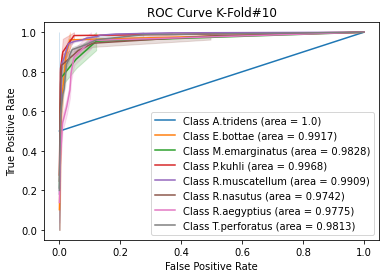

In [59]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [60]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9759197324414716
Std  0.0722408026755853
Sp:  E.bottae
AUC Mean  0.9927618694146405
Std  0.007357406267748565
Sp:  M.emarginatus
AUC Mean  0.975648665826412
Std  0.019134896974663133
Sp:  P.kuhli
AUC Mean  0.9949794327888055
Std  0.0035199987253420975
Sp:  R.muscatellum
AUC Mean  0.9932983603625098
Std  0.0032935139464532813
Sp:  R.nasutus
AUC Mean  0.9916085080804218
Std  0.008399202589842995
Sp:  R.aegyptius
AUC Mean  0.9911934427383061
Std  0.007297064678958507
Sp:  T.perforatus
AUC Mean  0.9894855032453984
Std  0.006219937271033912


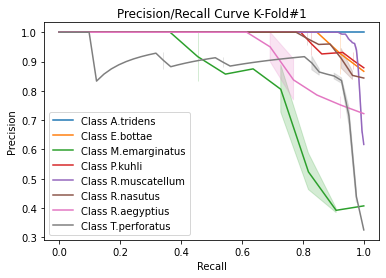

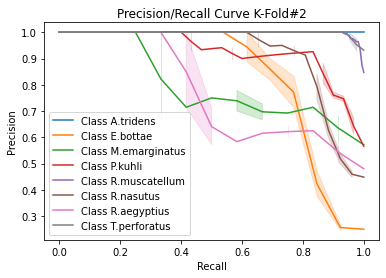

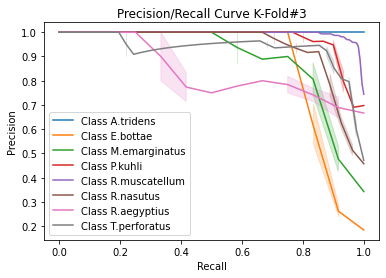

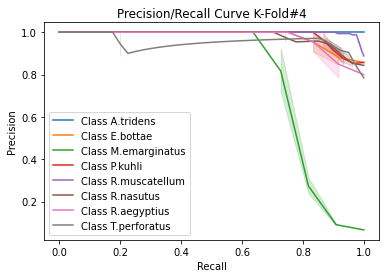

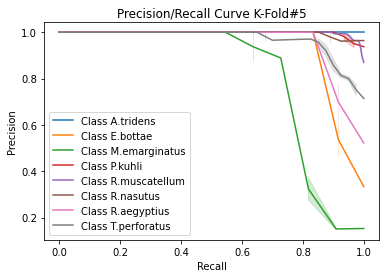

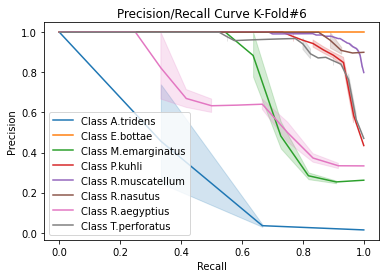

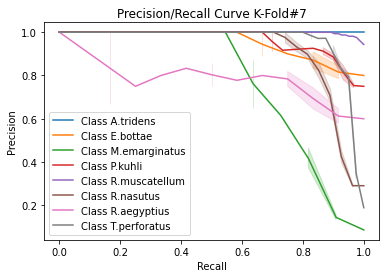

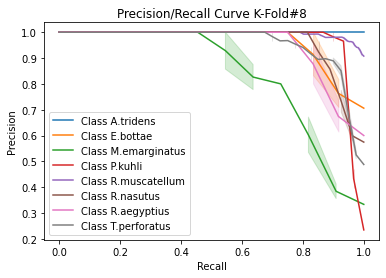

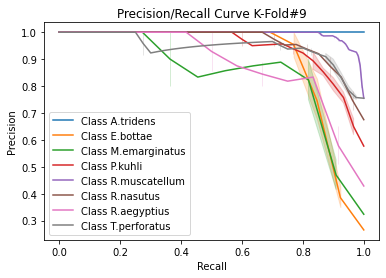

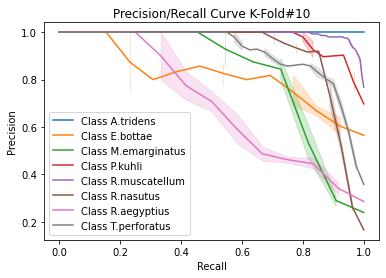

In [61]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   1   0   0   0]
 [  0   0   8   0   1   0   0   2]
 [  0   0   0  29   0   0   0   0]
 [  0   0   1   0 160   0   0   5]
 [  0   1   0   3   1  21   0   1]
 [  0   0   2   0   1   0   8   2]
 [  0   0   0   0   2   0   0  39]]


Confusion Matrix K-Fold #2

[[  1   1   0   0   0   0   0   0]
 [  0   9   0   0   0   1   3   0]
 [  0   0  11   0   1   0   0   0]
 [  0   0   3  26   1   0   0   0]
 [  0   0   2   0 160   0   3   1]
 [  0   2   0   2   0  20   2   0]
 [  0   0   0   0   1   0  11   0]
 [  0   0   0   0   1   0   0  40]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0  10   0   2   0   0   0]
 [  0   0   0  27   1   1   0   1]
 [  0   0   0   0 163   0   2   1]
 [  0   1   1   0   1  23   1   0]
 [  0   0   0   0   2   0  10   0]
 [  0   0   0   1   6   0   0  34]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

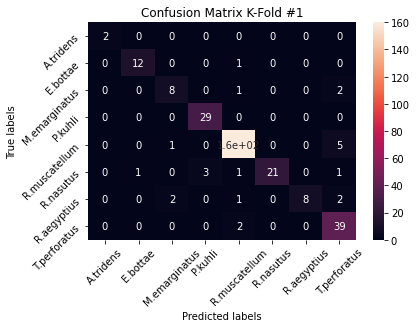

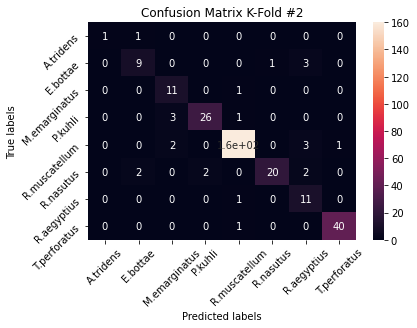

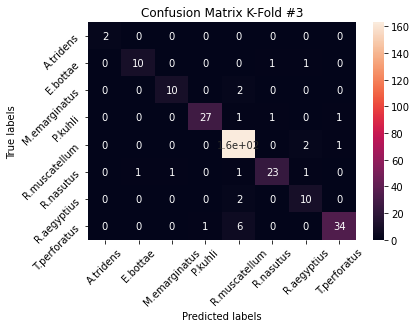

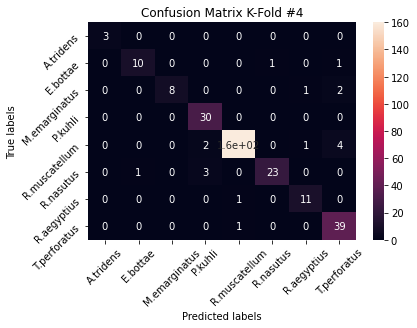

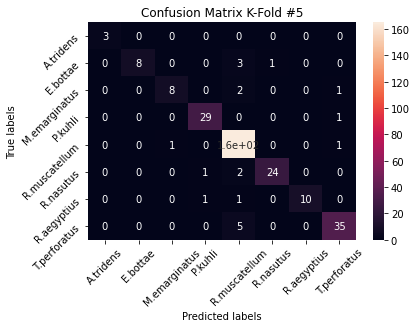

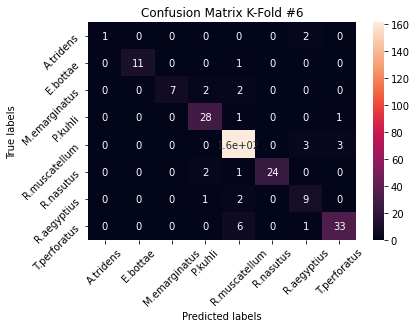

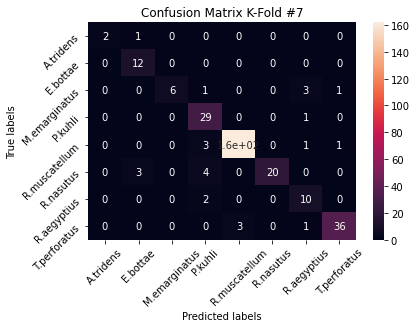

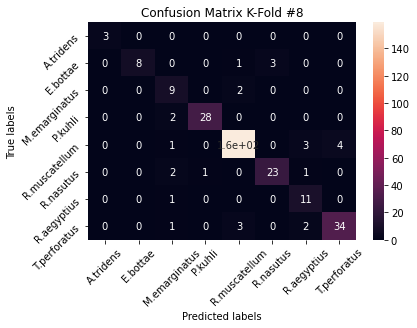

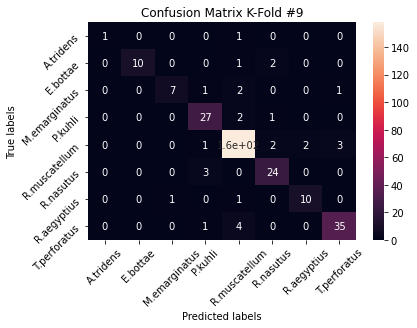

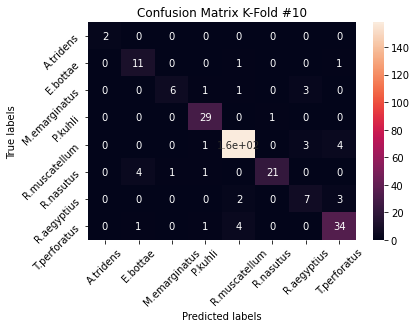

In [62]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  20    2    0    0    1    0    2    0]
 [   0  101    0    0    8    9    4    2]
 [   0    0   80    5   13    0    7    7]
 [   0    0    5  282    5    3    1    3]
 [   0    0    5    7 1606    2   18   27]
 [   0   12    4   20    5  223    4    1]
 [   0    0    4    4   11    0   97    5]
 [   0    1    1    3   35    0    4  359]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   0   0   0]
 [  0   0   8   0   1   0   0   0]
 [  0   0   0  28   0   0   0   0]
 [  0   0   0   0 160   0   1   2]
 [  0   1   0   2   0  22   0   0]
 [  0   0   0   0   1   0   9   0]
 [  0   0   0   0   3   0   0  35]]


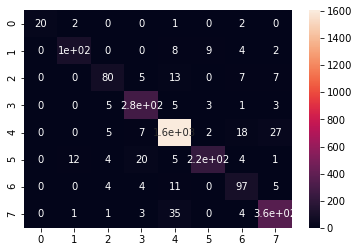

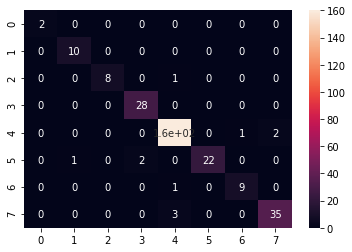

In [63]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.8  0.08 0.   0.   0.04 0.   0.08 0.  ]
 [0.   0.81 0.   0.   0.06 0.07 0.03 0.02]
 [0.   0.   0.71 0.04 0.12 0.   0.06 0.06]
 [0.   0.   0.02 0.94 0.02 0.01 0.   0.01]
 [0.   0.   0.   0.   0.96 0.   0.01 0.02]
 [0.   0.04 0.01 0.07 0.02 0.83 0.01 0.  ]
 [0.   0.   0.03 0.03 0.09 0.   0.8  0.04]
 [0.   0.   0.   0.01 0.09 0.   0.01 0.89]]


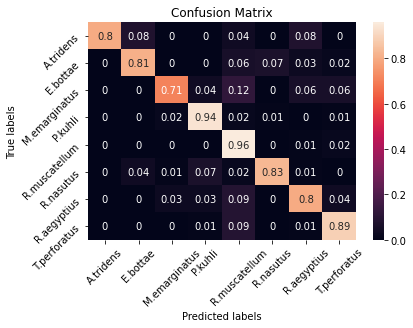

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

<h2> V5 !!!!! K-Fold Training and Evaluation</h2>

In [65]:
folder = "models"
mode_version = "stft_smote_v5"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/stft_smote_v5


In [66]:
def build_current_model():
    inp = inp = Input(shape=(112,170,3))
    c1 = Convolution2D(filters=120 ,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    bt = BatchNormalization()(c1)
    bt = Activation('relu')(bt)
    mpool = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(0.2)(mpool)


    c2 = Convolution2D(filters=96,kernel_size=(5,5),strides=(2,2),padding='same')(mpool)
    bt = BatchNormalization()(c2)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(0.3)(mpool)

    c2 = Convolution2D(filters=112,kernel_size=(3,3),strides=(1,1),padding='same')(mpool)
    bt = BatchNormalization()(c2)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(rate=0.3)(mpool)

    c3 = Convolution2D(filters=120,kernel_size=(3,3),strides=(1,1),padding='same')(mpool)
    bt = BatchNormalization()(c3)
    bt = Activation('relu')(bt)

    mpool = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(bt)
    mpool = Dropout(rate=0.4)(mpool)

    f = Flatten()(mpool)

    x_dense = Dense(512)(f)
    bt = BatchNormalization()(x_dense)
    bt = Activation('relu')(bt)
    bt = Dropout(0.4)(bt)


    x_dense = Dense(256)(bt)
    bt = BatchNormalization()(x_dense)
    bt = Activation('relu')(bt)
    bt = Dropout(0.3)(bt)

    x_dense = Dense(128)(bt)
    bt = BatchNormalization()(x_dense)
    bt = Activation('relu')(bt)
    bt = Dropout(0.2)(bt)

    x_out = Dense(8, name='output', activation='softmax')(bt)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
            optimizer=Adam(lr=0.003),
            loss='categorical_crossentropy',
            metrics=['accuracy']
        )
    return model


In [67]:
model = build_current_model()
model.summary()

Model: "model_44"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_45 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_154 (Conv2D)          (None, 56, 85, 120)       17760     
_________________________________________________________________
batch_normalization_198 (Bat (None, 56, 85, 120)       480       
_________________________________________________________________
activation_198 (Activation)  (None, 56, 85, 120)       0         
_________________________________________________________________
max_pooling2d_33 (MaxPooling (None, 28, 43, 120)       0         
_________________________________________________________________
dropout_154 (Dropout)        (None, 28, 43, 120)       0         
_________________________________________________________________
conv2d_155 (Conv2D)          (None, 14, 22, 96)        288

In [68]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 8s - loss: 1.7611 - accuracy: 0.3241 - val_loss: 1.5660 - val_accuracy: 0.3346
Epoch 2/100
1199/1199 - 7s - loss: 1.1805 - accuracy: 0.5466 - val_loss: 1.4764 - val_accuracy: 0.4467
Epoch 3/100
1199/1199 - 7s - loss: 0.8627 - accuracy: 0.6885 - val_loss: 1.0473 - val_accuracy: 0.6066
Epoch 4/100
1199/1199 - 8s - loss: 0.6231 - accuracy: 0.7847 - val_loss: 3.6086 - val_accuracy: 0.2132
Epoch 5/100
1199/1199 - 8s - loss: 0.4865 - accuracy: 0.8406 - val_loss: 0.9974 - val_accuracy: 0.6783

Epoch 5/100
1199/1199 - 8s - loss: 0.5244 - accuracy: 0.8219 - val_loss: 0.4210 - val_accuracy: 0.8493
Epoch 6/100
1199/1199 - 8s - loss: 0.4439 - accuracy: 0.8561 - val_loss: 0.4010 - val_accuracy: 0.8529
Epoch 7/100
1199/1199 - 8s - loss: 0.3822 - accuracy: 0.8774 - val_loss: 0.3834 - val_accuracy: 0.8824
Epoch 8/100
1199/1199 - 8s - loss: 0.3229 - accuracy: 0.8955 - val_loss: 0.3550 - val_accuracy: 0.8897
Epoch 9/100
1199/1199 - 8s - loss: 0.2677 - accuracy: 0.9193 - val_loss: 0.5797 - val_accuracy: 0.8382
Epoch 10/100
1199/1199 - 8s - loss: 0.2562 - accuracy: 0.9198 - val_loss: 0.3701 - val_accuracy: 0.8787
Epoch 11/100
1199/1199 - 8s - loss: 0.2443 - accuracy: 0.9271 - val_loss: 0.4628 - val_accuracy: 0.8290
Epoch 12/100
1199/1199 - 8s - loss: 0.2078 - accuracy: 0.9352 - val_loss: 0.5056 - val_accuracy: 0.8419
Epoch 13/100
1199/1199 - 8s - loss: 0.1955 - accuracy: 0.9413 - val_loss: 0.2272 - val_accuracy: 0.9191
Epoch 14/100
1199/1199 - 8s - loss: 0.1771 - accuracy: 0.9457 - val_l

Epoch 4/100
1199/1199 - 8s - loss: 0.5778 - accuracy: 0.8085 - val_loss: 1.0512 - val_accuracy: 0.6213
Epoch 5/100
1199/1199 - 8s - loss: 0.4737 - accuracy: 0.8488 - val_loss: 0.5127 - val_accuracy: 0.8143
Epoch 6/100
1199/1199 - 8s - loss: 0.3902 - accuracy: 0.8777 - val_loss: 0.5512 - val_accuracy: 0.8327
Epoch 7/100
1199/1199 - 8s - loss: 0.3353 - accuracy: 0.8945 - val_loss: 0.4021 - val_accuracy: 0.8732
Epoch 8/100
1199/1199 - 8s - loss: 0.2961 - accuracy: 0.9077 - val_loss: 0.6876 - val_accuracy: 0.7371
Epoch 9/100
1199/1199 - 8s - loss: 0.2505 - accuracy: 0.9236 - val_loss: 0.7915 - val_accuracy: 0.7739
Epoch 10/100
1199/1199 - 8s - loss: 0.2173 - accuracy: 0.9329 - val_loss: 0.2606 - val_accuracy: 0.9118
Epoch 11/100
1199/1199 - 8s - loss: 0.2021 - accuracy: 0.9383 - val_loss: 0.3449 - val_accuracy: 0.9026
Epoch 12/100
1199/1199 - 8s - loss: 0.2061 - accuracy: 0.9393 - val_loss: 0.5291 - val_accuracy: 0.8272
Epoch 13/100
1199/1199 - 8s - loss: 0.1700 - accuracy: 0.9478 - val_lo

X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Epoch 1/100
1198/1198 - 8s - loss: 1.7338 - accuracy: 0.3357 - val_loss: 2.4334 - val_accuracy: 0.5643
Epoch 2/100
1198/1198 - 8s - loss: 1.1763 - accuracy: 0.5545 - val_loss: 2.1908 - val_accuracy: 0.1305
Epoch 3/100
1198/1198 - 8s - loss: 0.8117 - accuracy: 0.7035 - val_loss: 1.2774 - val_accuracy: 0.5165
Epoch 4/100
1198/1198 - 8s - loss: 0.6023 - accuracy: 0.7909 - val_loss: 1.2248 - val_accuracy: 0.6636
Epoch 5/100
1198/1198 - 8s - loss: 0.4546 - accuracy: 0.8457 - val_loss: 0.4976 - val_accuracy: 0.7996
Epoch 6/100
1198/1198 - 8s - loss: 0.3687 - accuracy: 0.8842 - val_loss: 0.5565 - val_accuracy: 0.7923
Epoch 7/100
1198/1198 - 8s - loss: 0.3147 - accuracy: 0.8982 - val_loss: 0.4583 - val_accuracy: 0.8438
Epoch 8/100
1198/1198 - 8s - loss: 0.2856 - accuracy: 0.9100 - val_loss: 0.4043 - val_accuracy: 0.8621
Epoch 9/100
1198/1198 - 8s - loss: 0.2629 - accuracy: 0.9199 - val_loss: 0.3616 - val_accuracy: 0.8713
Epoch 10/

Epoch 19/100
1198/1198 - 8s - loss: 0.1279 - accuracy: 0.9619 - val_loss: 0.2053 - val_accuracy: 0.9430
Epoch 20/100
1198/1198 - 8s - loss: 0.1125 - accuracy: 0.9673 - val_loss: 0.3745 - val_accuracy: 0.9026
Epoch 21/100
1198/1198 - 8s - loss: 0.1184 - accuracy: 0.9635 - val_loss: 0.2794 - val_accuracy: 0.9412
Epoch 22/100
1198/1198 - 8s - loss: 0.1127 - accuracy: 0.9656 - val_loss: 0.2838 - val_accuracy: 0.9283
Epoch 23/100
1198/1198 - 8s - loss: 0.1062 - accuracy: 0.9686 - val_loss: 0.3515 - val_accuracy: 0.8952
Epoch 24/100
1198/1198 - 8s - loss: 0.0958 - accuracy: 0.9715 - val_loss: 0.2102 - val_accuracy: 0.9375
Epoch 25/100
1198/1198 - 8s - loss: 0.1042 - accuracy: 0.9705 - val_loss: 0.2583 - val_accuracy: 0.9430
Epoch 26/100
1198/1198 - 8s - loss: 0.0995 - accuracy: 0.9710 - val_loss: 0.3410 - val_accuracy: 0.9393
Epoch 27/100
1198/1198 - 8s - loss: 0.1001 - accuracy: 0.9705 - val_loss: 0.3144 - val_accuracy: 0.9118
Epoch 28/100
1198/1198 - 8s - loss: 0.1033 - accuracy: 0.9691 - 

Epoch 53/100
1198/1198 - 8s - loss: 0.0454 - accuracy: 0.9867 - val_loss: 0.2636 - val_accuracy: 0.9283
Epoch 54/100
1198/1198 - 8s - loss: 0.0453 - accuracy: 0.9872 - val_loss: 0.2058 - val_accuracy: 0.9485
Epoch 55/100
1198/1198 - 8s - loss: 0.0463 - accuracy: 0.9874 - val_loss: 0.1982 - val_accuracy: 0.9577
Epoch 56/100
1198/1198 - 8s - loss: 0.0544 - accuracy: 0.9857 - val_loss: 0.1341 - val_accuracy: 0.9651
Epoch 57/100
1198/1198 - 8s - loss: 0.0475 - accuracy: 0.9872 - val_loss: 0.2783 - val_accuracy: 0.9154
Epoch 58/100
1198/1198 - 8s - loss: 0.0430 - accuracy: 0.9866 - val_loss: 0.2708 - val_accuracy: 0.9467
Epoch 59/100
1198/1198 - 8s - loss: 0.0572 - accuracy: 0.9840 - val_loss: 0.3974 - val_accuracy: 0.9007
Epoch 60/100
1198/1198 - 8s - loss: 0.0425 - accuracy: 0.9870 - val_loss: 0.2961 - val_accuracy: 0.9320
Epoch 61/100
1198/1198 - 8s - loss: 0.0409 - accuracy: 0.9883 - val_loss: 0.2082 - val_accuracy: 0.9375
Epoch 62/100
1198/1198 - 8s - loss: 0.0478 - accuracy: 0.9872 - 

Epoch 54/100
1198/1198 - 8s - loss: 0.0414 - accuracy: 0.9896 - val_loss: 0.9115 - val_accuracy: 0.7923
Epoch 55/100
1198/1198 - 8s - loss: 0.0512 - accuracy: 0.9856 - val_loss: 0.2028 - val_accuracy: 0.9485
Epoch 56/100
1198/1198 - 8s - loss: 0.0376 - accuracy: 0.9879 - val_loss: 0.1049 - val_accuracy: 0.9743
Epoch 57/100
1198/1198 - 8s - loss: 0.0500 - accuracy: 0.9858 - val_loss: 0.2784 - val_accuracy: 0.9412
Epoch 58/100
1198/1198 - 8s - loss: 0.0462 - accuracy: 0.9865 - val_loss: 0.1320 - val_accuracy: 0.9743
Epoch 59/100
1198/1198 - 8s - loss: 0.0401 - accuracy: 0.9886 - val_loss: 0.1156 - val_accuracy: 0.9706
Epoch 60/100
1198/1198 - 8s - loss: 0.0497 - accuracy: 0.9848 - val_loss: 0.2454 - val_accuracy: 0.9467
Epoch 61/100
1198/1198 - 8s - loss: 0.0360 - accuracy: 0.9888 - val_loss: 0.2546 - val_accuracy: 0.9669
Epoch 62/100
1198/1198 - 8s - loss: 0.0464 - accuracy: 0.9874 - val_loss: 0.1655 - val_accuracy: 0.9577
Epoch 63/100
1198/1198 - 8s - loss: 0.0437 - accuracy: 0.9876 - 

Epoch 31/100
1198/1198 - 8s - loss: 0.0795 - accuracy: 0.9759 - val_loss: 0.1464 - val_accuracy: 0.9596
Epoch 32/100
1198/1198 - 8s - loss: 0.0817 - accuracy: 0.9751 - val_loss: 0.1315 - val_accuracy: 0.9540
Epoch 33/100
1198/1198 - 8s - loss: 0.0774 - accuracy: 0.9780 - val_loss: 0.2211 - val_accuracy: 0.9357
Epoch 34/100
1198/1198 - 8s - loss: 0.0784 - accuracy: 0.9775 - val_loss: 0.1027 - val_accuracy: 0.9632
Epoch 35/100
1198/1198 - 8s - loss: 0.0736 - accuracy: 0.9800 - val_loss: 0.0894 - val_accuracy: 0.9743
Epoch 36/100
1198/1198 - 8s - loss: 0.0704 - accuracy: 0.9795 - val_loss: 0.5226 - val_accuracy: 0.8566
Epoch 37/100
1198/1198 - 8s - loss: 0.0801 - accuracy: 0.9790 - val_loss: 0.1323 - val_accuracy: 0.9596
Epoch 38/100
1198/1198 - 8s - loss: 0.0625 - accuracy: 0.9815 - val_loss: 0.2405 - val_accuracy: 0.9265
Epoch 39/100
1198/1198 - 8s - loss: 0.0769 - accuracy: 0.9782 - val_loss: 0.1530 - val_accuracy: 0.9559
Epoch 40/100
1198/1198 - 8s - loss: 0.0526 - accuracy: 0.9837 - 

Epoch 49/100
1199/1199 - 8s - loss: 0.0480 - accuracy: 0.9860 - val_loss: 0.2152 - val_accuracy: 0.9522
Epoch 50/100
1199/1199 - 8s - loss: 0.0566 - accuracy: 0.9833 - val_loss: 0.1897 - val_accuracy: 0.9632
Epoch 51/100
1199/1199 - 8s - loss: 0.0530 - accuracy: 0.9833 - val_loss: 0.1443 - val_accuracy: 0.9577
Epoch 52/100
1199/1199 - 8s - loss: 0.0570 - accuracy: 0.9824 - val_loss: 0.1900 - val_accuracy: 0.9632
Epoch 53/100
1199/1199 - 8s - loss: 0.0511 - accuracy: 0.9866 - val_loss: 0.3599 - val_accuracy: 0.9099
Epoch 54/100
1199/1199 - 8s - loss: 0.0560 - accuracy: 0.9845 - val_loss: 0.2441 - val_accuracy: 0.9577
Epoch 55/100
1199/1199 - 8s - loss: 0.0489 - accuracy: 0.9857 - val_loss: 0.2264 - val_accuracy: 0.9522
Epoch 56/100
1199/1199 - 8s - loss: 0.0510 - accuracy: 0.9867 - val_loss: 0.6055 - val_accuracy: 0.8529
Epoch 57/100
1199/1199 - 8s - loss: 0.0473 - accuracy: 0.9871 - val_loss: 0.1660 - val_accuracy: 0.9577
Epoch 58/100
1199/1199 - 8s - loss: 0.0566 - accuracy: 0.9840 - 

# LOAD AND EVAL

In [69]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [70]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
       
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

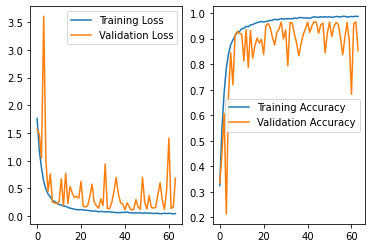

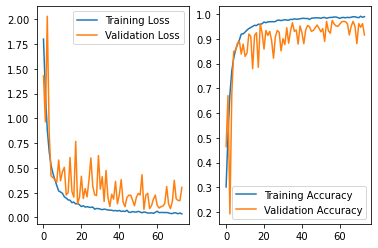

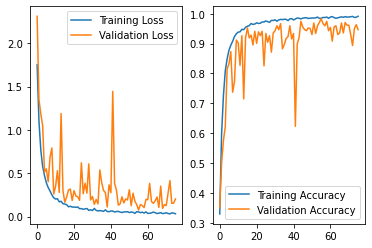

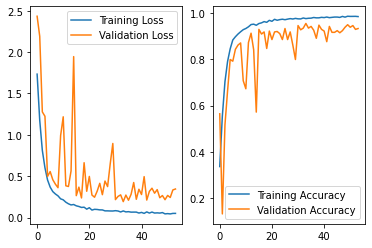

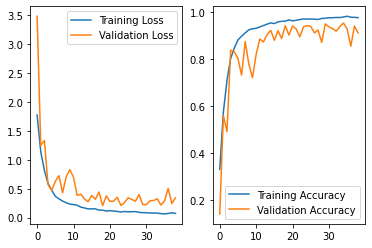

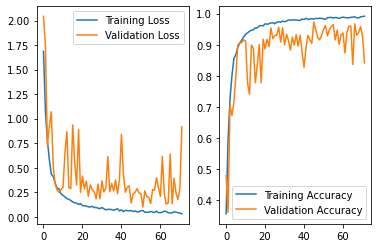

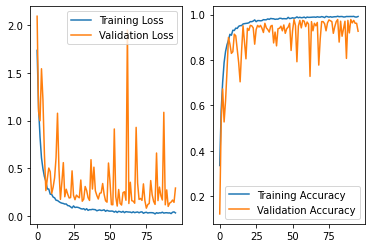

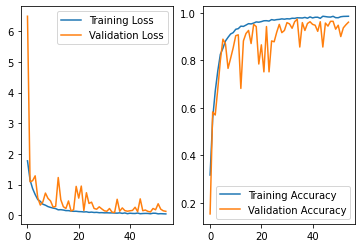

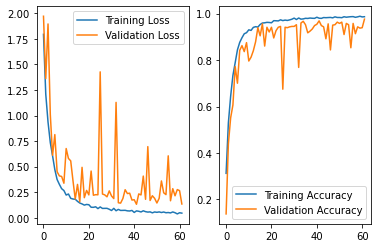

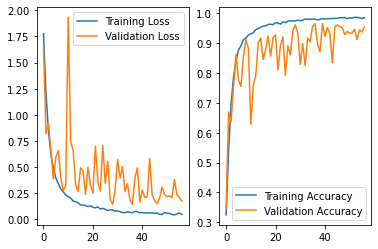

In [71]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [72]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [1.         0.91873626 0.86179681 0.95014732 0.98522536 0.9802963
 0.8507326  0.93650844]
precision sdev by class [0.         0.0644429  0.07261281 0.04596518 0.01553123 0.0367279
 0.07975899 0.04054369]
macro precision mean 0.9354303866680083
macro precision sdev 0.02034134868067322
recall mean [0.93333333 0.95192308 0.85454545 0.97333333 0.97656374 0.93276353
 0.90897436 0.95018293]
recall sdev [0.2        0.0522544  0.11642044 0.02494438 0.01022511 0.0410731
 0.08708517 0.03877114]
macro recall mean 0.9352024695865321
macro recall sdev 0.022479777806638877
f1 mean [0.95       0.93307098 0.85306623 0.9608778  0.98073501 0.9557203
 0.87566175 0.94216505]
f1 sdev [0.15       0.0419438  0.07516896 0.02728596 0.00601698 0.03626299
 0.06726481 0.02362614]
macro f1 mean 0.9314121385465753
macro f1 sdev 0.022103531914604194
accuracy mean 0.9602395986886977
accuracy sdev 0.007975192750030669


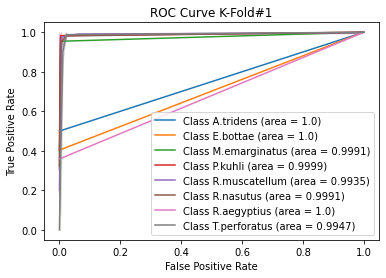

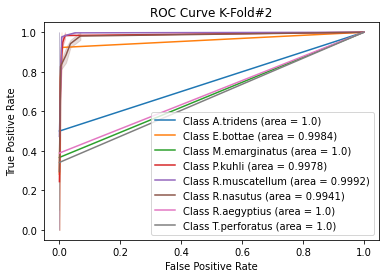

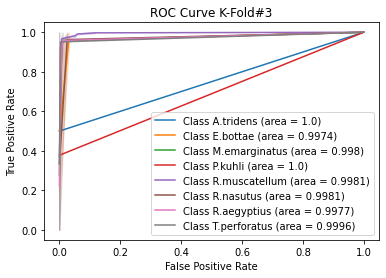

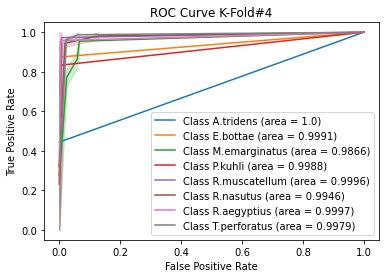

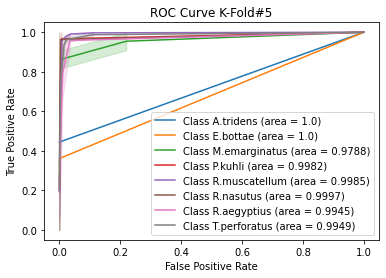

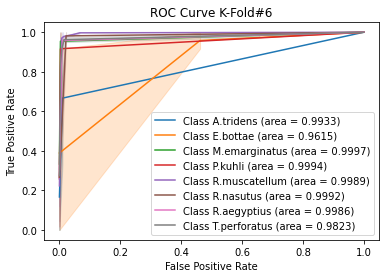

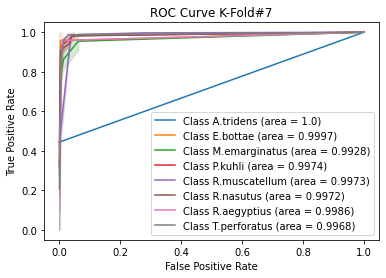

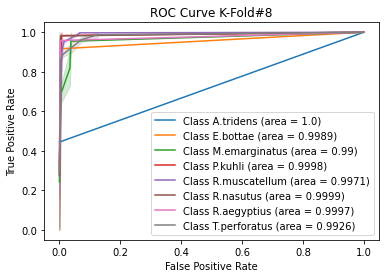

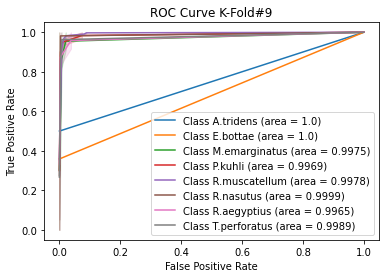

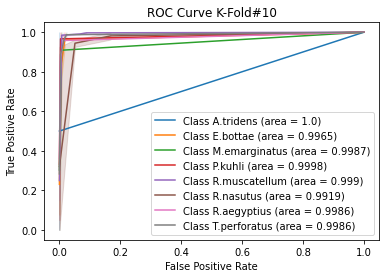

In [73]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [74]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9993311036789297
Std  0.0020066889632107013
Sp:  E.bottae
AUC Mean  0.9951539954282019
Std  0.0112751813127216
Sp:  M.emarginatus
AUC Mean  0.9941118346637365
Std  0.0067043130380544606
Sp:  P.kuhli
AUC Mean  0.9987851675926374
Std  0.0010760828634666267
Sp:  R.muscatellum
AUC Mean  0.9979146380834678
Std  0.001668760794739843
Sp:  R.nasutus
AUC Mean  0.9973645793185621
Std  0.0026982481531069064
Sp:  R.aegyptius
AUC Mean  0.9983891142663961
Std  0.0016580046511365176
Sp:  T.perforatus
AUC Mean  0.9956263932670912
Std  0.004976316428339335


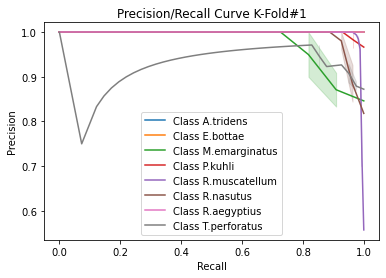

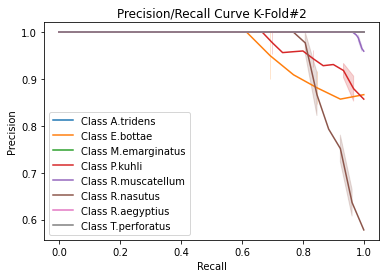

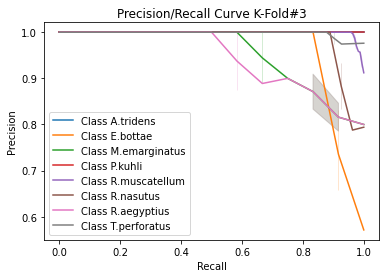

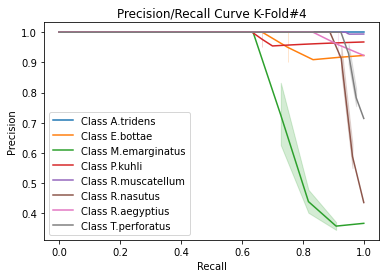

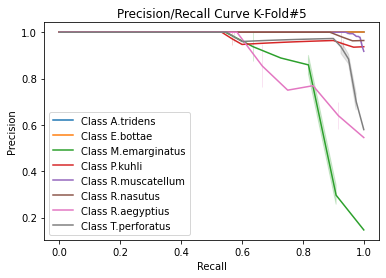

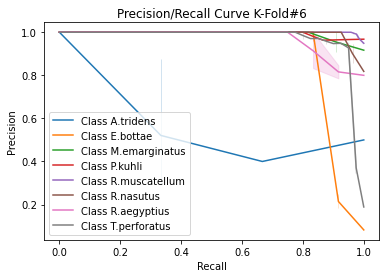

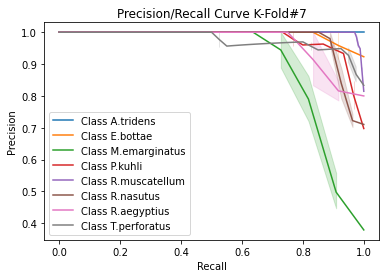

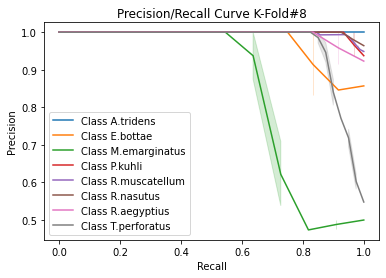

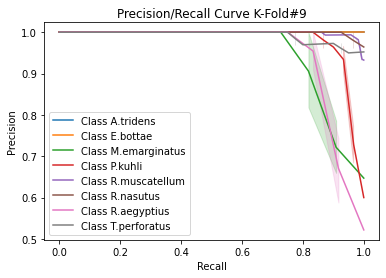

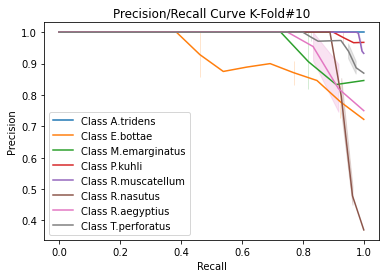

In [75]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0   9   0   0   0   0   2]
 [  0   0   0  29   0   0   0   0]
 [  0   0   0   1 161   1   0   3]
 [  0   0   0   1   0  26   0   0]
 [  0   0   0   0   0   0  12   1]
 [  0   0   1   0   0   0   0  40]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   1   1   0   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0   0  29   0   1   0   0]
 [  0   0   0   2 161   1   1   1]
 [  0   1   0   3   0  22   0   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   1   0]
 [  0   0  12   0   0   0   0   0]
 [  0   0   0  29   1   0   0   0]
 [  0   0   2   0 162   0   1   1]
 [  0   0   1   0   1  25   0   0]
 [  0   0   0   0   1   0  11   0]
 [  0   0   0   0   2   0   0  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

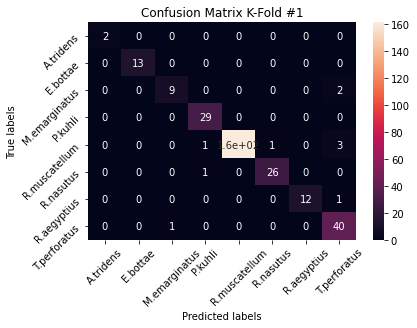

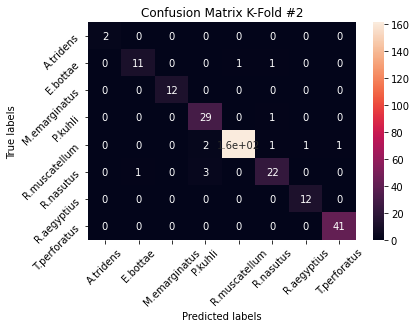

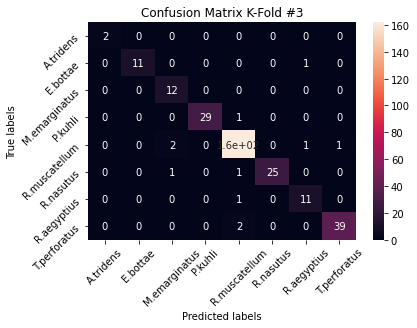

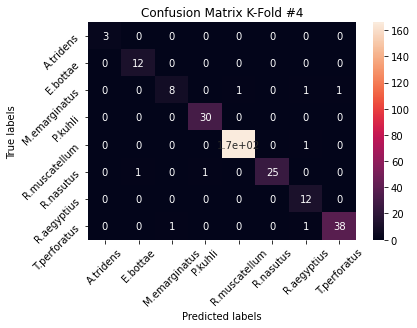

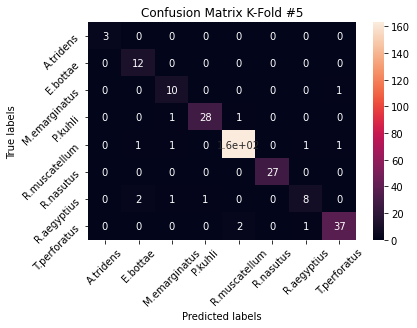

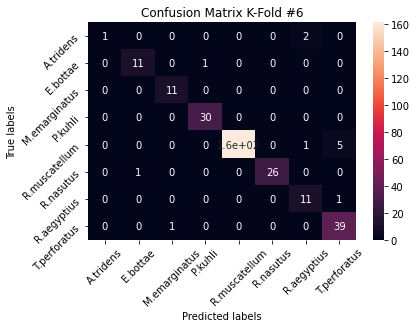

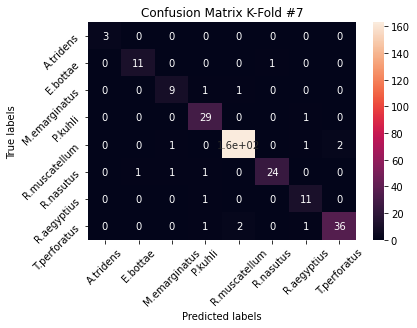

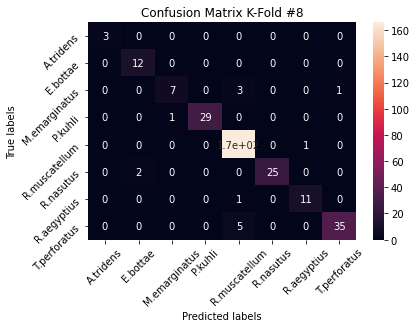

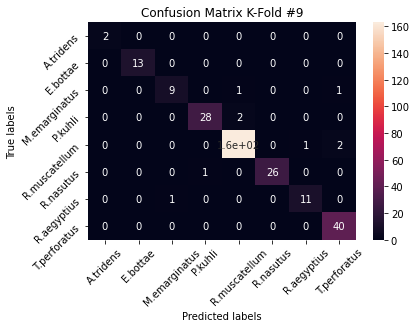

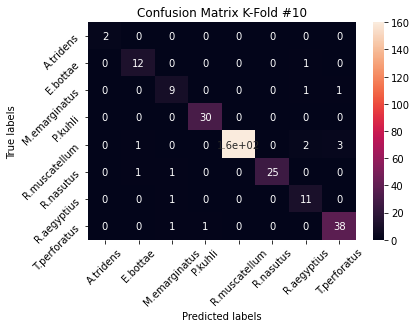

In [76]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  23    0    0    0    0    0    2    0]
 [   0  118    0    1    1    2    2    0]
 [   0    0   96    1    6    0    2    7]
 [   0    0    2  291    4    1    1    0]
 [   0    2    4    3 1626    2   10   18]
 [   0    7    3    7    1  251    0    0]
 [   0    2    3    2    2    0  110    2]
 [   0    0    4    2   11    0    3  383]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   9   0   0   0   0   0]
 [  0   0   0  29   0   0   0   0]
 [  0   0   0   0 162   0   1   1]
 [  0   0   0   0   0  25   0   0]
 [  0   0   0   0   0   0  11   0]
 [  0   0   0   0   1   0   0  38]]


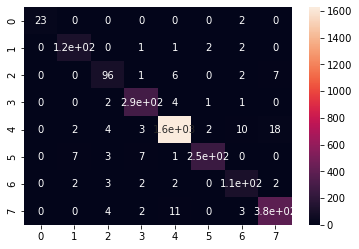

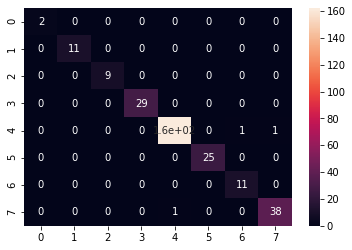

In [77]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.92 0.   0.   0.   0.   0.   0.08 0.  ]
 [0.   0.95 0.   0.01 0.01 0.02 0.02 0.  ]
 [0.   0.   0.86 0.01 0.05 0.   0.02 0.06]
 [0.   0.   0.01 0.97 0.01 0.   0.   0.  ]
 [0.   0.   0.   0.   0.98 0.   0.01 0.01]
 [0.   0.03 0.01 0.03 0.   0.93 0.   0.  ]
 [0.   0.02 0.02 0.02 0.02 0.   0.91 0.02]
 [0.   0.   0.01 0.   0.03 0.   0.01 0.95]]


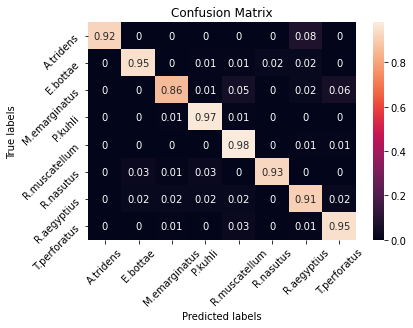

In [78]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

# V6 Re-Load Data

In [79]:
folder = "models"
mode_version = "stft_smote_v6"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/stft_smote_v6


In [80]:
X_all = []
Y_all = []

image_folder_path = '../../data/STFT'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((85, 56))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [81]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 56, 85, 3)
(3018,)


In [82]:
def build_current_model():
    inp = Input(shape=(56,85,3))
    
    lay = Convolution2D(filters=40,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=136,kernel_size=(3,3),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.4)(lay)

    lay = Convolution2D(filters=232,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.5)(lay)

    lay = Convolution2D(filters=232,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Flatten()(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [83]:
model = build_current_model()
model.summary()

Model: "model_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_56 (InputLayer)        [(None, 56, 85, 3)]       0         
_________________________________________________________________
conv2d_198 (Conv2D)          (None, 28, 43, 40)        5920      
_________________________________________________________________
batch_normalization_275 (Bat (None, 28, 43, 40)        160       
_________________________________________________________________
activation_275 (Activation)  (None, 28, 43, 40)        0         
_________________________________________________________________
max_pooling2d_44 (MaxPooling (None, 14, 22, 40)        0         
_________________________________________________________________
dropout_231 (Dropout)        (None, 14, 22, 40)        0         
_________________________________________________________________
conv2d_199 (Conv2D)          (None, 7, 11, 136)        490

In [84]:
from sklearn.model_selection import StratifiedKFold
n_split=10
n_classes=8

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
        
my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]
       
count = 1

for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
    
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
    x_train, y_train= makeOverSamplesSMOTE(x_train, y_train)
    
    # create and fit the model
    cv_model=build_current_model() # lr,dense,cnn
    history = cv_model.fit(x_train, y_train,
              batch_size=8,
              epochs=100,
              validation_data= (x_val, y_val),
              verbose=2,
              callbacks=my_callbacks)
    
    
    file_name = mode_version +'_iter_' +str(count)

    #Store History
    hist_df = pd.DataFrame(history.history) 
    hist_json_file = file_name + '.json'
    
    with open(hist_json_file, mode='w') as f:
       hist_df.to_json(f)
    
    model_file = file_name + '.model'
    print(model_file)
    #Save Model
    cv_model.save(model_file) #Save the model
    
    count+=1



    
    
    

Original trainingset shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 5s - loss: 1.5097 - accuracy: 0.4451 - val_loss: 2.0831 - val_accuracy: 0.2463
Epoch 2/100
1199/1199 - 5s - loss: 0.8926 - accuracy: 0.6545 - val_loss: 2.0355 - val_accuracy: 0.3474
Epoch 3/100
1199/1199 - 4s - loss: 0.5732 - accuracy: 0.7870 - val_loss: 1.7665 - val_accuracy: 0.4540
Epoch 4/100
1199/1199 - 5s - loss: 0.4201 - accuracy: 0.8536 - val_loss: 1.2470 - val_accuracy: 0.6949
Epoch 5/100
1199/1199 - 6s - loss: 0.3433 - accuracy: 0.8786 - val_loss: 0.8934 - val_accuracy: 0.7040
E

Epoch 31/100
1199/1199 - 5s - loss: 0.0930 - accuracy: 0.9697 - val_loss: 0.3868 - val_accuracy: 0.8401
Epoch 32/100
1199/1199 - 5s - loss: 0.0829 - accuracy: 0.9731 - val_loss: 0.2574 - val_accuracy: 0.9136
Epoch 33/100
1199/1199 - 4s - loss: 0.0802 - accuracy: 0.9735 - val_loss: 1.0718 - val_accuracy: 0.7132
Epoch 34/100
1199/1199 - 5s - loss: 0.0760 - accuracy: 0.9752 - val_loss: 0.3333 - val_accuracy: 0.8768
Epoch 35/100
1199/1199 - 4s - loss: 0.0701 - accuracy: 0.9773 - val_loss: 0.2189 - val_accuracy: 0.9191
Epoch 36/100
1199/1199 - 4s - loss: 0.0734 - accuracy: 0.9770 - val_loss: 0.2158 - val_accuracy: 0.9430
Epoch 37/100
1199/1199 - 5s - loss: 0.0739 - accuracy: 0.9778 - val_loss: 0.1892 - val_accuracy: 0.9449
Epoch 38/100
1199/1199 - 5s - loss: 0.0667 - accuracy: 0.9776 - val_loss: 0.2767 - val_accuracy: 0.8860
Epoch 39/100
1199/1199 - 4s - loss: 0.0651 - accuracy: 0.9796 - val_loss: 0.2747 - val_accuracy: 0.9136
Epoch 40/100
1199/1199 - 4s - loss: 0.0658 - accuracy: 0.9781 - 

Epoch 58/100
1199/1199 - 6s - loss: 0.0537 - accuracy: 0.9839 - val_loss: 0.6779 - val_accuracy: 0.7831
Epoch 59/100
1199/1199 - 5s - loss: 0.0502 - accuracy: 0.9837 - val_loss: 0.2319 - val_accuracy: 0.9228
Epoch 60/100
1199/1199 - 5s - loss: 0.0486 - accuracy: 0.9850 - val_loss: 0.2434 - val_accuracy: 0.9357
Epoch 61/100
1199/1199 - 5s - loss: 0.0521 - accuracy: 0.9835 - val_loss: 0.3302 - val_accuracy: 0.9044
Epoch 62/100
1199/1199 - 5s - loss: 0.0536 - accuracy: 0.9830 - val_loss: 0.6430 - val_accuracy: 0.8529
Epoch 63/100
1199/1199 - 4s - loss: 0.0440 - accuracy: 0.9855 - val_loss: 0.2936 - val_accuracy: 0.9357
Epoch 64/100
1199/1199 - 5s - loss: 0.0546 - accuracy: 0.9842 - val_loss: 0.2964 - val_accuracy: 0.9246
Epoch 65/100
Restoring model weights from the end of the best epoch.
1199/1199 - 5s - loss: 0.0527 - accuracy: 0.9833 - val_loss: 0.8101 - val_accuracy: 0.7904
Epoch 00065: early stopping
models/stft_smote_v6_iter_3.model
INFO:tensorflow:Assets written to: models/stft_smo

Epoch 13/100
1198/1198 - 5s - loss: 0.1526 - accuracy: 0.9500 - val_loss: 0.5764 - val_accuracy: 0.8088
Epoch 14/100
1198/1198 - 5s - loss: 0.1438 - accuracy: 0.9527 - val_loss: 0.3814 - val_accuracy: 0.8879
Epoch 15/100
1198/1198 - 5s - loss: 0.1298 - accuracy: 0.9561 - val_loss: 0.5346 - val_accuracy: 0.8254
Epoch 16/100
1198/1198 - 5s - loss: 0.1272 - accuracy: 0.9604 - val_loss: 0.4538 - val_accuracy: 0.8603
Epoch 17/100
1198/1198 - 4s - loss: 0.1227 - accuracy: 0.9580 - val_loss: 0.2449 - val_accuracy: 0.9301
Epoch 18/100
1198/1198 - 5s - loss: 0.1205 - accuracy: 0.9578 - val_loss: 0.4980 - val_accuracy: 0.8713
Epoch 19/100
1198/1198 - 5s - loss: 0.1154 - accuracy: 0.9593 - val_loss: 1.0011 - val_accuracy: 0.6562
Epoch 20/100
1198/1198 - 4s - loss: 0.0980 - accuracy: 0.9678 - val_loss: 0.3668 - val_accuracy: 0.8824
Epoch 21/100
1198/1198 - 4s - loss: 0.1120 - accuracy: 0.9649 - val_loss: 0.8959 - val_accuracy: 0.8290
Epoch 22/100
1198/1198 - 6s - loss: 0.1013 - accuracy: 0.9661 - 

Epoch 49/100
1198/1198 - 4s - loss: 0.0576 - accuracy: 0.9829 - val_loss: 0.1941 - val_accuracy: 0.9485
Epoch 50/100
1198/1198 - 5s - loss: 0.0523 - accuracy: 0.9832 - val_loss: 0.3390 - val_accuracy: 0.9044
Epoch 51/100
1198/1198 - 5s - loss: 0.0584 - accuracy: 0.9822 - val_loss: 1.7060 - val_accuracy: 0.6728
Epoch 52/100
1198/1198 - 5s - loss: 0.0564 - accuracy: 0.9826 - val_loss: 0.5810 - val_accuracy: 0.8254
Epoch 53/100
1198/1198 - 5s - loss: 0.0491 - accuracy: 0.9845 - val_loss: 0.2327 - val_accuracy: 0.9246
Epoch 54/100
1198/1198 - 4s - loss: 0.0486 - accuracy: 0.9848 - val_loss: 0.2131 - val_accuracy: 0.9320
Epoch 55/100
1198/1198 - 4s - loss: 0.0567 - accuracy: 0.9823 - val_loss: 0.2961 - val_accuracy: 0.9228
Epoch 56/100
1198/1198 - 4s - loss: 0.0552 - accuracy: 0.9829 - val_loss: 0.2447 - val_accuracy: 0.9191
Epoch 57/100
1198/1198 - 4s - loss: 0.0531 - accuracy: 0.9836 - val_loss: 0.1936 - val_accuracy: 0.9559
Epoch 58/100
1198/1198 - 5s - loss: 0.0498 - accuracy: 0.9839 - 

Epoch 10/100
1198/1198 - 5s - loss: 0.2007 - accuracy: 0.9332 - val_loss: 0.5663 - val_accuracy: 0.8088
Epoch 11/100
1198/1198 - 5s - loss: 0.1730 - accuracy: 0.9393 - val_loss: 2.1822 - val_accuracy: 0.6287
Epoch 12/100
1198/1198 - 5s - loss: 0.1654 - accuracy: 0.9436 - val_loss: 0.3992 - val_accuracy: 0.8603
Epoch 13/100
1198/1198 - 6s - loss: 0.1567 - accuracy: 0.9461 - val_loss: 1.4776 - val_accuracy: 0.7096
Epoch 14/100
1198/1198 - 5s - loss: 0.1471 - accuracy: 0.9493 - val_loss: 0.6588 - val_accuracy: 0.7684
Epoch 15/100
1198/1198 - 5s - loss: 0.1403 - accuracy: 0.9549 - val_loss: 0.4191 - val_accuracy: 0.8676
Epoch 16/100
1198/1198 - 5s - loss: 0.1310 - accuracy: 0.9563 - val_loss: 0.3384 - val_accuracy: 0.8952
Epoch 17/100
1198/1198 - 4s - loss: 0.1412 - accuracy: 0.9535 - val_loss: 0.3665 - val_accuracy: 0.8713
Epoch 18/100
1198/1198 - 4s - loss: 0.1131 - accuracy: 0.9622 - val_loss: 0.6180 - val_accuracy: 0.7923
Epoch 19/100
1198/1198 - 4s - loss: 0.1156 - accuracy: 0.9630 - 

Epoch 43/100
Restoring model weights from the end of the best epoch.
1199/1199 - 5s - loss: 0.0582 - accuracy: 0.9805 - val_loss: 0.3406 - val_accuracy: 0.9136
Epoch 00043: early stopping
models/stft_smote_v6_iter_9.model
INFO:tensorflow:Assets written to: models/stft_smote_v6_iter_9.model/assets
Original trainingset shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 1199), ('R.aegyptius', 1199), ('R.nasutus', 1199), ('E.bottae', 1199), ('A.tridens', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)
Epoch 1/100
1199/1199 - 5s - loss: 1.5507 - accuracy: 0.4186 - val_loss: 1.5896 - val_accuracy: 0.4982
Epoch 2/100
1199/1199 - 4s - loss: 0.9396 - accuracy: 0.6412 - val_loss: 1.1255 - val_accuracy: 0.4908
Epoch 3/100


## LOAD AND EVAL

In [85]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.metrics import confusion_matrix

n_split=10
n_classes=8


In [86]:
all_base_precision = list()
all_base_recall = list()
all_macro_precision = list()
all_macro_recall = list()
all_f1 = list()
all_macro_f1 = list()

all_tpr = list()
all_fpr = list()
all_precision = list()
all_recall = list()
all_cm=list()
all_accuracy = list()

all_df = list()

y_all_labelled=[]
for i in range(len(Y_all)):
        y_all_labelled.append(np.argmax(Y_all[i]))
             
count = 1


for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
    # use the index to generate training an testing sets
    x_train,x_test=X_all[train_index],X_all[test_index]
    y_train,y_test=Y_all[train_index],Y_all[test_index]
        
    
    file_name = mode_version +'_iter_' +str(count)

    #Load History 
    hist_json_file = file_name + '.json'
    history_info = pd.read_json(hist_json_file)
    all_df.append(history_info)
    
   
    # Load Model
    model_file = file_name + '.model'
    cv_model = tf.keras.models.load_model(model_file) 
    
    count+=1

    #generate predictions
    y_pred = cv_model.predict(x_test)
    actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)
    
    #calc metrics
    curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
    curr_macro_prec = precision_score(actual, predicted,average='macro')
    curr_macro_rec = recall_score(actual, predicted,average='macro')
    curr_macro_f1 = f1_score(actual, predicted,average='macro')
    
    actual_labeled = list()
    predict_labeled = list()
    for x,y in zip(actual,predicted):
        actual_labeled.append(getSpecies(x))
        predict_labeled.append(getSpecies(y))
        
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
    curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)
    
    curr_fpr = [0] * n_classes
    curr_tpr = [0] * n_classes
    for i in range(n_classes):
        curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])
        
    curr_prec = [0] * n_classes
    curr_rec = [0] * n_classes
    for i in range(n_classes):
        curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])

        
    curr_accuracy = accuracy_score(actual, predicted)
    
    #add to lists
    all_base_precision.append(curr_base_prec)
    all_base_recall.append(curr_base_rec)
    all_macro_precision.append(curr_macro_prec)
    all_macro_recall.append(curr_macro_rec)
    
    all_f1.append(curr_f1)
    all_macro_f1.append(curr_macro_f1)
    
    all_accuracy.append(curr_accuracy)

    
    all_fpr.append(curr_fpr)
    all_tpr.append(curr_tpr)
    all_precision.append(curr_prec)
    all_recall.append(curr_rec)
    all_cm.append(curr_cm)

    
    
    

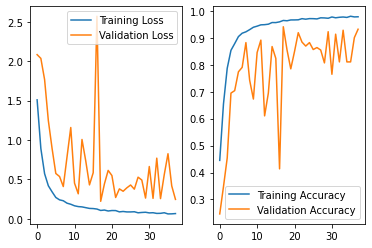

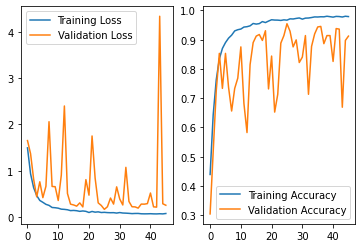

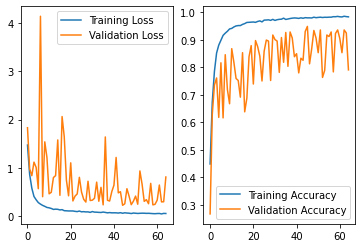

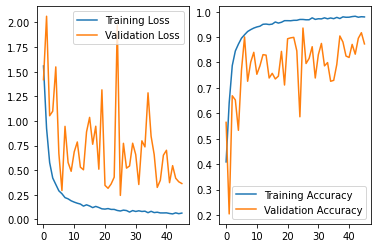

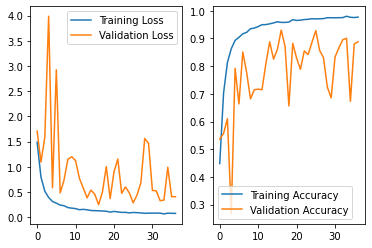

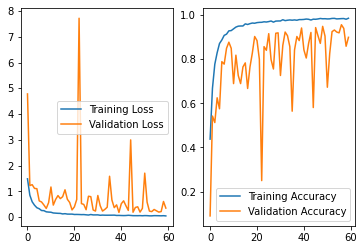

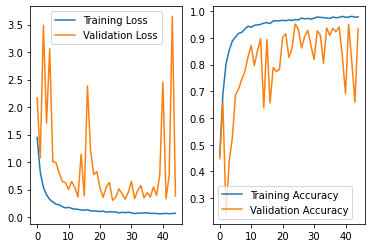

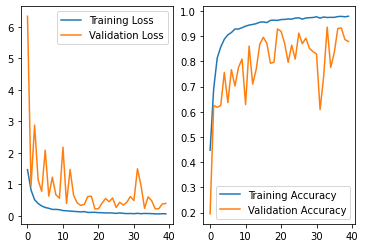

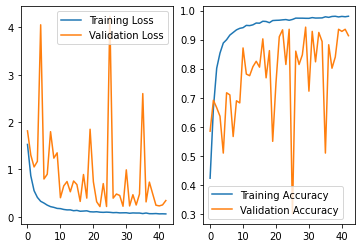

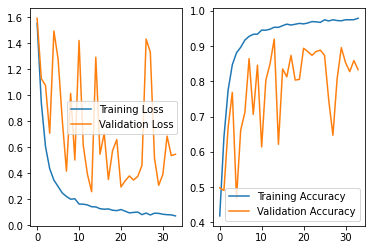

In [87]:
for df in all_df:
    _, axs = plt.subplots(ncols=2)

    sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
    sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

    sns.lineplot(data=df['accuracy'],ax=axs[1], label='Training Accuracy', legend='brief')
    sns.lineplot(data=df['val_accuracy'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [88]:
print('precision mean by class', np.array(all_base_precision).mean(axis=0))
print('precision sdev by class', np.array(all_base_precision).std(axis=0))

print('macro precision mean', np.array(all_macro_precision).mean())
print('macro precision sdev', np.array(all_macro_precision).std())


print('recall mean', np.array(all_base_recall).mean(axis=0))
print('recall sdev', np.array(all_base_recall).std(axis=0))

print('macro recall mean', np.array(all_macro_recall).mean())
print('macro recall sdev', np.array(all_macro_recall).std())

print('f1 mean', np.array(all_f1).mean(axis=0))
print('f1 sdev', np.array(all_f1).std(axis=0))

print('macro f1 mean', np.array(all_macro_f1).mean())
print('macro f1 sdev', np.array(all_macro_f1).std())

print('accuracy mean', np.array(all_accuracy).mean())
print('accuracy sdev', np.array(all_accuracy).std())



precision mean by class [1.         0.91471861 0.84194444 0.91331129 0.95574405 0.93716048
 0.87485958 0.89601379]
precision sdev by class [0.         0.08308954 0.11579336 0.06646229 0.02739006 0.05272912
 0.12746749 0.06886139]
macro precision mean 0.9167190316849793
macro precision sdev 0.02962771042862205
recall mean [0.88333333 0.91282051 0.75984848 0.89965517 0.97415771 0.88133903
 0.78653846 0.8979878 ]
recall sdev [0.23629078 0.08139764 0.11707181 0.06325401 0.01808261 0.09029148
 0.10764842 0.08752456]
macro recall mean 0.8744600637313367
macro recall sdev 0.047068260179402306
f1 mean [0.91666667 0.91272005 0.78678684 0.90414135 0.96444612 0.90463211
 0.82065601 0.89200258]
f1 sdev [0.17078251 0.07755126 0.06583433 0.04582245 0.01243041 0.05121085
 0.08941728 0.04870186]
macro f1 mean 0.8877564670851102
macro f1 sdev 0.041699407389973714
accuracy mean 0.9294019933554818
accuracy sdev 0.023881639233522527


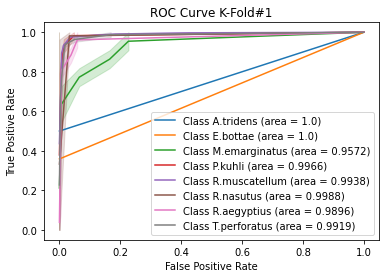

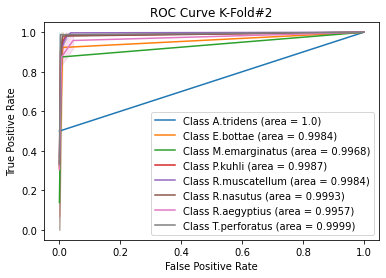

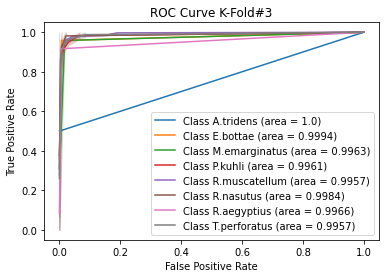

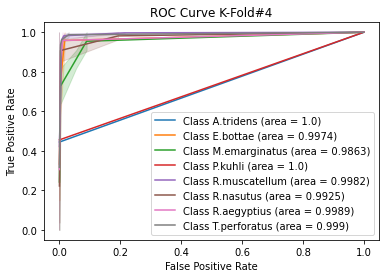

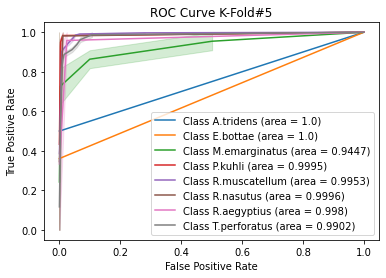

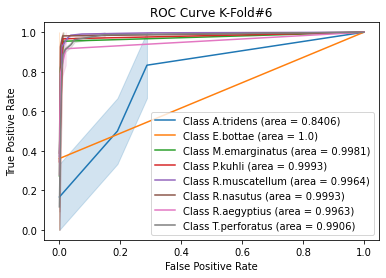

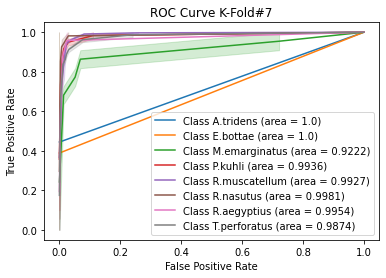

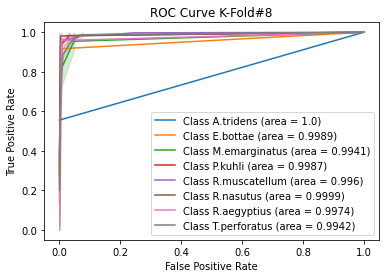

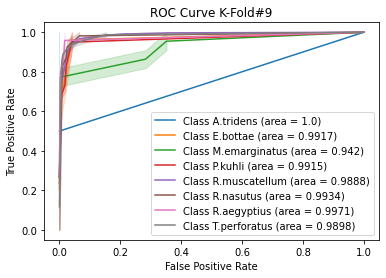

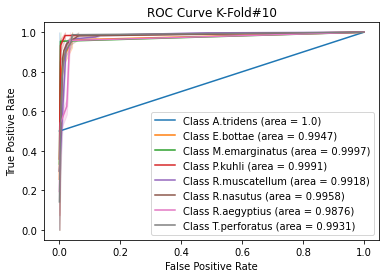

In [89]:
# Plot all K-Fold ROC curves

for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        auc_val = np.around(auc_val,4)
        sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')
        

In [90]:
aucs = list()

for i in range(n_classes):
    aucs.append(list())


# Plot all K-Fold ROC curves

for i in range(n_split):
    for j in range(n_classes):
        auc_val = auc(all_fpr[i][j], all_tpr[i][j])
        aucs[j].append(auc_val)
        
for i in range(n_classes):
    print("Sp: ", getSpecies(i))
    print("AUC Mean ", np.array(aucs[i]).mean())
    print("Std ", np.array(aucs[i]).std())

Sp:  A.tridens
AUC Mean  0.9840579710144928
Std  0.047826086956521754
Sp:  E.bottae
AUC Mean  0.9980470841402562
Std  0.002642806751236433
Sp:  M.emarginatus
AUC Mean  0.973735793771343
Std  0.02767173830021571
Sp:  P.kuhli
AUC Mean  0.997302583752383
Std  0.0026841304402040593
Sp:  R.muscatellum
AUC Mean  0.9946983859275699
Std  0.0028334049673173606
Sp:  R.nasutus
AUC Mean  0.9975021486089399
Std  0.0025431397301351175
Sp:  R.aegyptius
AUC Mean  0.9952497713081175
Std  0.0034897215759719853
Sp:  T.perforatus
AUC Mean  0.993168717377487
Std  0.00384955373496063


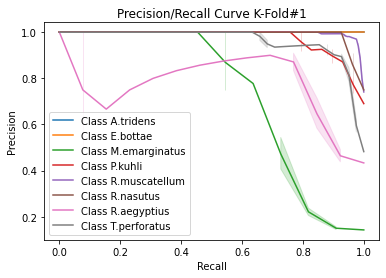

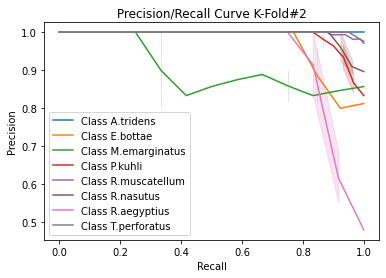

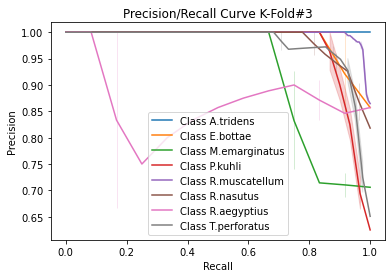

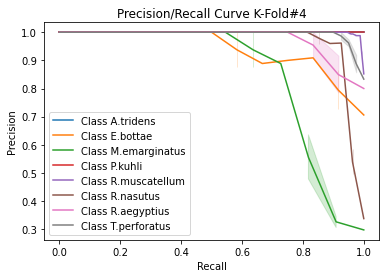

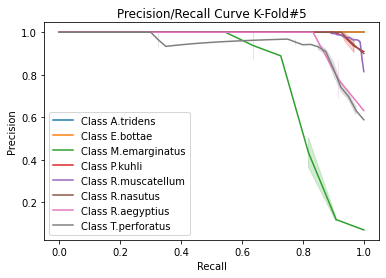

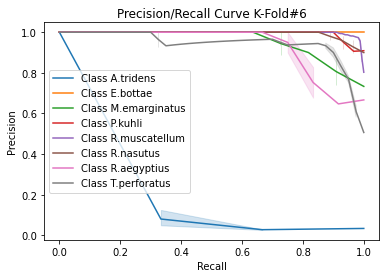

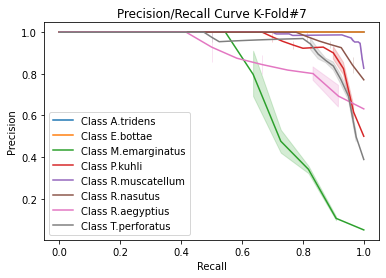

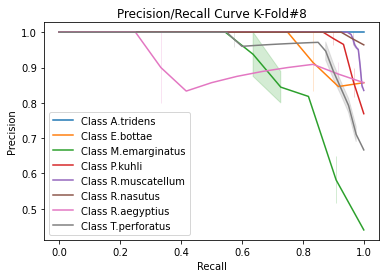

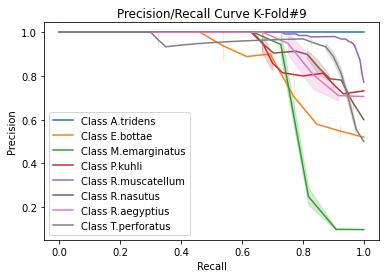

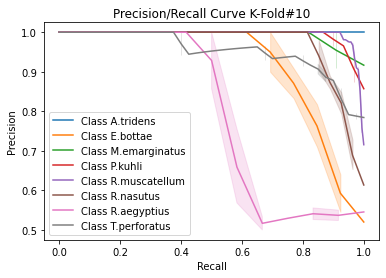

In [91]:
#Plot all K-Fold Precision/Recall curves
for i in range(n_split):
    _, axs = plt.subplots(ncols=1)
    axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
    for j in range(n_classes):
        sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0   8   0   2   0   1   0]
 [  0   0   0  26   2   0   0   1]
 [  0   0   1   1 163   0   0   1]
 [  0   0   0   3   1  23   0   0]
 [  0   0   1   0   3   0   8   1]
 [  0   0   0   0   6   0   0  35]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   2   0   0   0]
 [  0   0   7   1   1   0   1   2]
 [  0   0   1  26   0   2   0   1]
 [  0   0   0   0 164   0   0   2]
 [  0   1   0   0   0  25   0   0]
 [  0   0   0   0   1   0  11   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   1   0   0   0]
 [  0   0  10   1   0   0   0   1]
 [  0   0   0  27   1   1   0   1]
 [  0   0   1   1 160   0   1   3]
 [  0   1   0   0   2  24   0   0]
 [  0   0   0   0   1   0  11   0]
 [  0   0   1   0   1   0   0  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

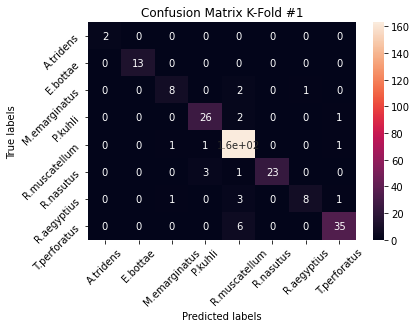

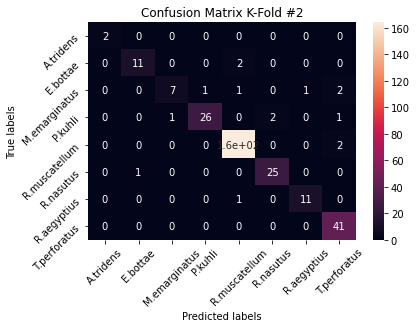

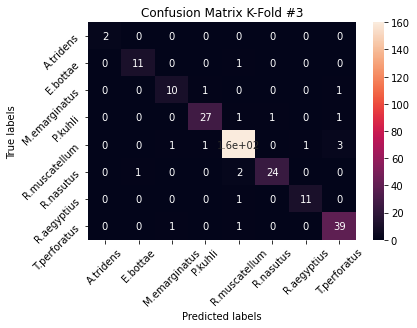

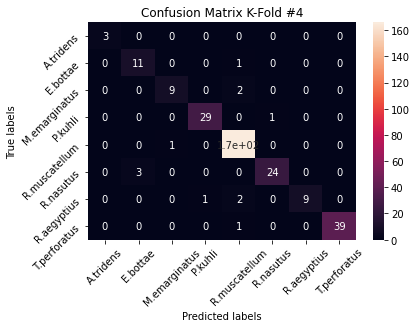

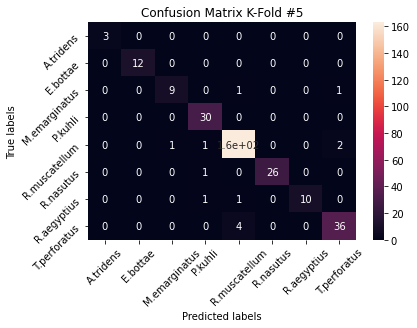

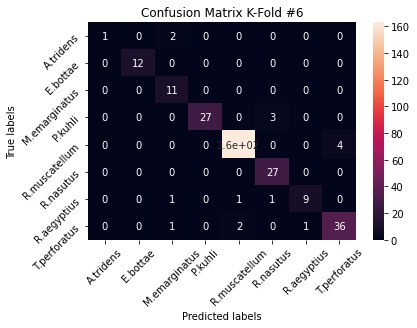

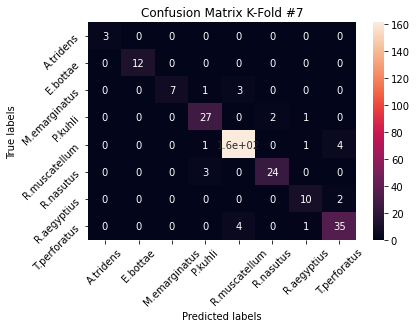

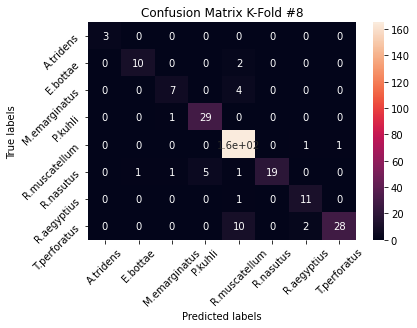

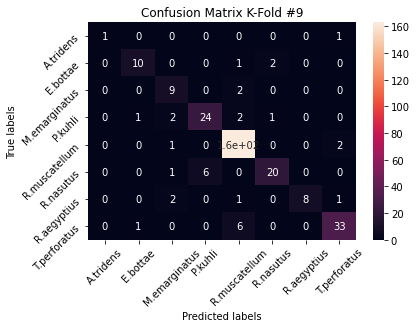

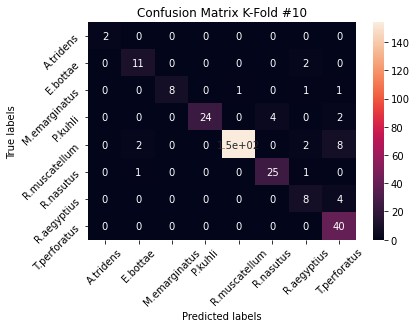

In [92]:
## Plot all K-Fold confusion matrices
import numpy as np
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib import pyplot as plt

# Create 1X 5 sub plots
# gs = gridspec.GridSpec(1,n_split)
figs=[]
for i in range(n_split):
    figs.append(plt.figure())
    
for i in range(n_split):
    print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
    print(all_cm[i])
    print("\n")
    
    ax=figs[i].add_subplot()
    sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells

    
    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

sum of all confuion matrices
 [[  22    0    2    0    0    0    0    1]
 [   0  113    0    0    7    2    2    0]
 [   0    0   85    3   16    0    3    5]
 [   0    1    4  269    5   14    1    5]
 [   0    2    5    4 1622    0    5   27]
 [   0    7    2   18    4  237    1    0]
 [   0    0    4    2   11    1   95    8]
 [   0    1    2    0   34    0    4  362]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   8   0   1   0   0   0]
 [  0   0   0  26   0   1   0   0]
 [  0   0   0   0 162   0   0   2]
 [  0   0   0   1   0  23   0   0]
 [  0   0   0   0   1   0   9   0]
 [  0   0   0   0   3   0   0  36]]


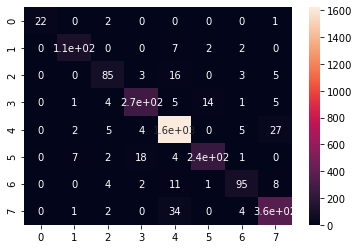

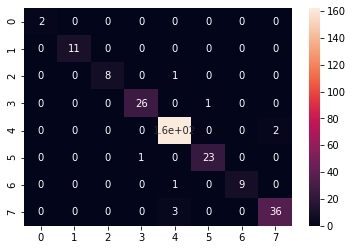

In [93]:
## plot macro cm

sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
for i in range(n_split):
    sum_all_cm+=all_cm[i]
    
    
#plot 
figs=[]
for i in range(2):
    figs.append(plt.figure())
       
print("sum of all confuion matrices\n",sum_all_cm)
ax=figs[0].add_subplot()
sns.heatmap(sum_all_cm, annot=True, ax = ax);

avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
print("\naverage of all confuion matrices\n",avg_all_cm)
ax=figs[1].add_subplot()
sns.heatmap(avg_all_cm, annot=True, ax = ax);

[[0.88 0.   0.08 0.   0.   0.   0.   0.04]
 [0.   0.91 0.   0.   0.06 0.02 0.02 0.  ]
 [0.   0.   0.76 0.03 0.14 0.   0.03 0.04]
 [0.   0.   0.01 0.9  0.02 0.05 0.   0.02]
 [0.   0.   0.   0.   0.97 0.   0.   0.02]
 [0.   0.03 0.01 0.07 0.01 0.88 0.   0.  ]
 [0.   0.   0.03 0.02 0.09 0.01 0.79 0.07]
 [0.   0.   0.   0.   0.08 0.   0.01 0.9 ]]


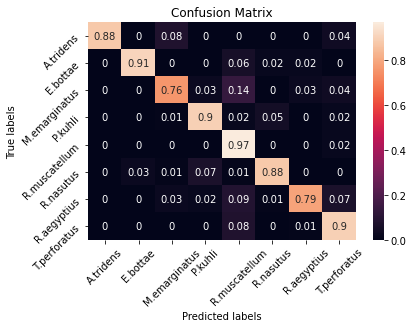

In [94]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
cm = (np.around(cm,2))
print(cm)


labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);